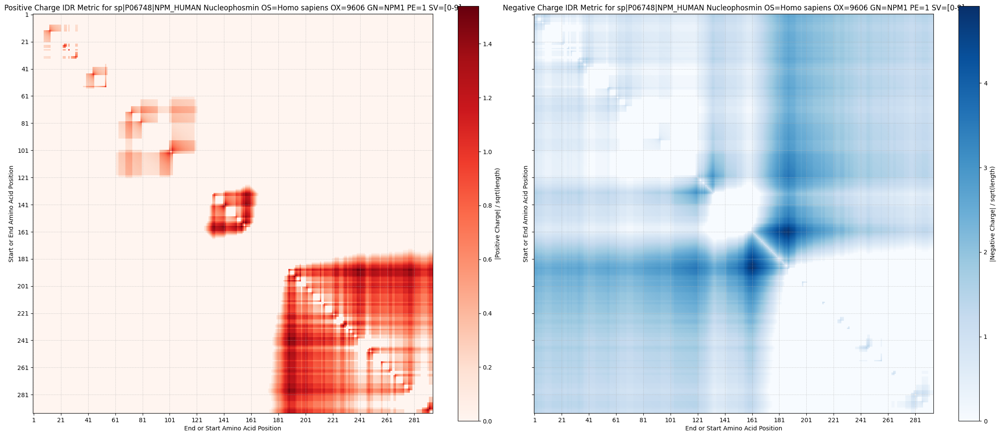

IDR Metric Analysis for sp|P06748|NPM_HUMAN Nucleophosmin OS=Homo sapiens OX=9606 GN=NPM1 PE=1 SV=[0-9]
Max Positive |Charge| / sqrt(length): 1.54 at Start=189, End=239
Net Charge: 11, Length: 51, Metric: 1.54
Sequence: KAPVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQESFKKQEKTPKTPK

Max Negative |Charge| / sqrt(length): 4.91 at Start=161, End=188
Net Charge: -26, Length: 28, Metric: 4.91
Sequence: DEDDDDDDEEDDDEDDDDDDFDDEEAEE



In [5]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read the first sequence from the FASTA file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/test.fasta"
with open(file_path, "r") as f:
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())
sequence = sequences[0]  # Use the first sequence
name = names[0]

# Get disorder prediction and NCPR data
disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
positions = range(1, len(sequence) + 1)

try:
    SeqOb = SequenceParameters(sequence)
except:
    print(f"Error with sequence: {name}")
    sys.exit(1)
ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
ncpr_x = ncpr_data[0, :]
ncpr_y = ncpr_data[1, :]

# Function to calculate net charge for a region
def calculate_net_charge(sequence, start, end):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    charge_pos = sum(1 for aa in region if aa in 'RK')  # Positive (R, K)
    charge_neg = sum(1 for aa in region if aa in 'DE')  # Negative (D, E)
    return charge_pos - charge_neg

# Generate symmetric heatmap data for positive and negative charges
max_len = len(sequence)
heatmap_pos = np.zeros((max_len, max_len))  # For positive charge
heatmap_neg = np.zeros((max_len, max_len))  # For negative charge
for start in range(1, max_len + 1):
    for end in range(start, max_len + 1):  # Include start = end and end > start
        length = end - start + 1
        if length > 0:  # Avoid division by zero
            charge = calculate_net_charge(sequence, start, end)
            normalized_metric = abs(charge) / np.sqrt(length)
            if charge > 0:
                heatmap_pos[start-1, end-1] = normalized_metric  # Lower triangle
                if start != end:
                    heatmap_pos[end-1, start-1] = normalized_metric  # Mirror to upper triangle
            elif charge < 0:
                heatmap_neg[start-1, end-1] = normalized_metric  # Lower triangle
                if start != end:
                    heatmap_neg[end-1, start-1] = normalized_metric  # Mirror to upper triangle

# Create figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 10), sharey=True)

# Heatmap for positive charge
im1 = ax1.imshow(heatmap_pos, cmap='Reds', interpolation='nearest', aspect='equal')
ax1.set_title(f'Positive Charge IDR Metric for {name}')
ax1.set_xlabel('End or Start Amino Acid Position')
ax1.set_ylabel('Start or End Amino Acid Position')
fig.colorbar(im1, ax=ax1, label='|Positive Charge| / sqrt(length)')
ax1.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)

# Heatmap for negative charge
im2 = ax2.imshow(heatmap_neg, cmap='Blues', interpolation='nearest', aspect='equal')
ax2.set_title(f'Negative Charge IDR Metric for {name}')
ax2.set_xlabel('End or Start Amino Acid Position')
ax2.set_ylabel('Start or End Amino Acid Position')
fig.colorbar(im2, ax=ax2, label='|Negative Charge| / sqrt(length)')
ax2.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)

# Set ticks
for ax in [ax1, ax2]:
    ax.set_xticks(np.arange(0, max_len, 20))
    ax.set_xticklabels(np.arange(1, max_len + 1, 20))
    ax.set_yticks(np.arange(0, max_len, 20))
    ax.set_yticklabels(np.arange(1, max_len + 1, 20))

plt.tight_layout()

# Save plots
plt.savefig(f"/home/ilnitsky/NPM/45_Species/{name}_idr_metric_heatmap_pos_neg.png", dpi=300, bbox_inches='tight')
plt.savefig(f"/home/ilnitsky/NPM/45_Species/{name}_idr_metric_heatmap_pos_neg.pdf", bbox_inches='tight')
plt.show()

# Print insights for both positive and negative maxima
print("="*80)
print(f"IDR Metric Analysis for {name}")
print("="*80)

# Positive charge max
max_pos_metric = np.max(heatmap_pos)
max_pos_pos = np.unravel_index(np.argmax(heatmap_pos), heatmap_pos.shape)
start_pos_max, end_pos_max = max_pos_pos[0] + 1, max_pos_pos[1] + 1
charge_pos_max = calculate_net_charge(sequence, min(start_pos_max, end_pos_max), max(start_pos_max, end_pos_max))
length_pos_max = max(end_pos_max, start_pos_max) - min(start_pos_max, end_pos_max) + 1
metric_pos_max = abs(charge_pos_max) / np.sqrt(length_pos_max) if charge_pos_max > 0 else 0
print(f"Max Positive |Charge| / sqrt(length): {max_pos_metric:.2f} at Start={min(start_pos_max, end_pos_max)}, End={max(start_pos_max, end_pos_max)}")
print(f"Net Charge: {charge_pos_max}, Length: {length_pos_max}, Metric: {metric_pos_max:.2f}")
print(f"Sequence: {sequence[min(start_pos_max, end_pos_max)-1:max(end_pos_max, start_pos_max)]}")

# Negative charge max
max_neg_metric = np.max(heatmap_neg)
max_neg_pos = np.unravel_index(np.argmax(heatmap_neg), heatmap_neg.shape)
start_neg_max, end_neg_max = max_neg_pos[0] + 1, max_neg_pos[1] + 1
charge_neg_max = calculate_net_charge(sequence, min(start_neg_max, end_neg_max), max(start_neg_max, end_neg_max))
length_neg_max = max(end_neg_max, start_neg_max) - min(start_neg_max, end_neg_max) + 1
metric_neg_max = abs(charge_neg_max) / np.sqrt(length_neg_max) if charge_neg_max < 0 else 0
print(f"\nMax Negative |Charge| / sqrt(length): {max_neg_metric:.2f} at Start={min(start_neg_max, end_neg_max)}, End={max(start_neg_max, end_neg_max)}")
print(f"Net Charge: {charge_neg_max}, Length: {length_neg_max}, Metric: {metric_neg_max:.2f}")
print(f"Sequence: {sequence[min(start_neg_max, end_neg_max)-1:max(end_neg_max, start_neg_max)]}")
print("\n" + "="*80)

STRUCTURED & IDR REGIONS (Window=4, Median<0.6, Length>30; IDR Threshold=50% of max NCPR peak)

sp|P06748|NPM_HUMAN Nucleophosmin OS=Homo sapiens OX=9606 GN=NPM1 PE=1 SV=[0-9]
-------------------------------------------------------------------------------
Domain 1-115 (115aa) MEDSMDMDMSPLRPQNYLFGCELKADKDYHFKVDNDENEHQLSLRTVSLGAGAKDELHIVEAEAMNYEGSPIKVTLATLKMSVQPTVSLGGFEITPPVVLRLKCGSGPVHISGQH
Domain 263-294 (32aa) KVEAKFINYVKNCFRMTDQEAIQDLWQWRKSL
'+'IDR 140-159 GKRSAPGGGSKVPQKKVKLA
'+'IDR 191-225 PVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQ
'+'IDR 229-242 KKQEKTPKTPKGPS
'+'IDR 249-253 AKMQA
'-'IDR 119-134 VEEDAESEDEEEEDVK
'-'IDR 160-190 ADEDDDDDDEEDDDEDDDDDDFDDEEAEEKA
'-'IDR 244-247 VEDI

XP_065882692.1 nucleoplasmin-like protein ANO39 isoform X1 [Dysidea avara]
--------------------------------------------------------------------------
Domain 56-102 (47aa) DSEPNLLTVTAENTKGEEITHPLAWLNKKSVSESQCSMHIALPPPVT
'+'IDR 16-20 GKKQE
'+'IDR 160-162 VIK
'+'IDR 168-174 QAKKRPA
'+'IDR 181-188 AAKVAKKD
'+'IDR 192

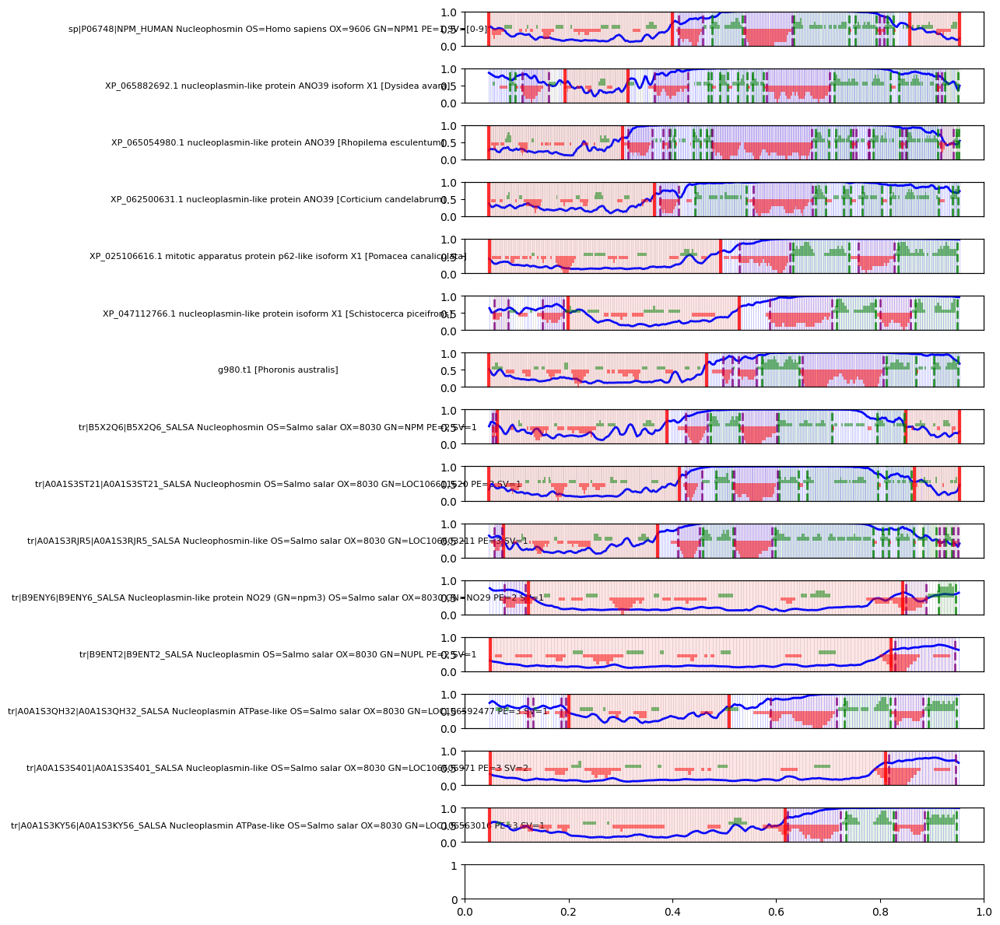

In [6]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
from ete3 import NCBITaxa
import random
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read clustered fasta file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/test.fasta"
with open(file_path, "r") as f: 
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())

sequences4plot = sequences
names4plot = names

# SLIDING WINDOW FUNCTION for structured regions
def get_structured_regions(disorder_scores, sequence, window=4, threshold=0.6, min_length=30):
    positions = range(1, len(sequence) + 1)
    structured_mask = []
    
    for i in range(len(disorder_scores)):
        start = max(0, i - window + 1)
        end = min(len(disorder_scores), i + 1)
        window_scores = disorder_scores[start:end]
        median_score = np.median(window_scores)
        structured_mask.append(median_score < threshold)
    
    structured_regions = []
    in_region = False
    start_pos = None
    
    for pos, is_structured in zip(positions, structured_mask):
        if is_structured and not in_region:
            in_region = True
            start_pos = pos
        elif not is_structured and in_region:
            end_pos = pos - 1
            length = end_pos - start_pos + 1
            if length >= min_length:
                seq_region = sequence[start_pos-1:end_pos]
                structured_regions.append((start_pos, end_pos, length, seq_region))
            in_region = False
    
    if in_region:
        end_pos = len(sequence)
        length = end_pos - start_pos + 1
        if length >= min_length:
            seq_region = sequence[start_pos-1:end_pos]
            structured_regions.append((start_pos, end_pos, length, seq_region))
    
    return structured_regions

# FUNCTION TO GET IDR REGIONS BASED ON NCPR, excluding regions inside structured domains
def get_idr_regions(ncpr_y, sequence, structured_regions, threshold_factor=0.2):
    positions = range(1, len(sequence) + 1)
    idr_regions = {"positive": [], "negative": []}
    
    # Find the highest peak (absolute value)
    max_peak = np.max(np.abs(ncpr_y))
    peak_threshold = max_peak * threshold_factor
    
    # Convert structured regions to a set of positions
    structured_positions = set()
    for start, end, _, _ in structured_regions:
        structured_positions.update(range(start, end + 1))
    
    # Identify regions where |NCPR| exceeds threshold and crosses zero
    in_positive = False
    in_negative = False
    start_pos_pos = None
    start_pos_neg = None
    
    ncpr_detection = -0.1

    for pos, ncpr in zip(positions, ncpr_y):
        # Skip if position is within a structured region
        if pos in structured_positions:
            if in_positive:
                end_pos = pos - 1
                if start_pos_pos and end_pos >= start_pos_pos:
                    seq_region = sequence[start_pos_pos-1:end_pos]
                    idr_regions["positive"].append((start_pos_pos, end_pos, seq_region))
                in_positive = False
            if in_negative:
                end_pos = pos - 1
                if start_pos_neg and end_pos >= start_pos_neg:
                    seq_region = sequence[start_pos_neg-1:end_pos]
                    idr_regions["negative"].append((start_pos_neg, end_pos, seq_region))
                in_negative = False
            continue
        
        # Positive IDR (NCPR > 0 and exceeds threshold)
        if ncpr > peak_threshold and not in_positive:
            in_positive = True
            start_pos_pos = pos
        elif (ncpr <= ncpr_detection or pos == len(sequence)) and in_positive:
            end_pos = pos - 1 if pos <= len(sequence) else pos
            if start_pos_pos and end_pos >= start_pos_pos and not any(start <= start_pos_pos <= end or start <= end_pos <= end for start, end, _, _ in structured_regions):
                seq_region = sequence[start_pos_pos-1:end_pos]
                idr_regions["positive"].append((start_pos_pos, end_pos, seq_region))
            in_positive = False
        
        # Negative IDR (NCPR < 0 and exceeds threshold)
        if ncpr < -peak_threshold and not in_negative:
            in_negative = True
            start_pos_neg = pos
        elif (ncpr >= -ncpr_detection or pos == len(sequence)) and in_negative:
            end_pos = pos - 1 if pos <= len(sequence) else pos
            if start_pos_neg and end_pos >= start_pos_neg and not any(start <= start_pos_neg <= end or start <= end_pos <= end for start, end, _, _ in structured_regions):
                seq_region = sequence[start_pos_neg-1:end_pos]
                idr_regions["negative"].append((start_pos_neg, end_pos, seq_region))
            in_negative = False
    
    return idr_regions

fig, axs = plt.subplots(len(sequences4plot), 1, figsize=(12, 0.75*len(sequences4plot)), squeeze=False)
axs = axs.ravel()

# PRINT SECTIONS
print("="*80)
print("STRUCTURED & IDR REGIONS (Window=4, Median<0.6, Length>30; IDR Threshold=50% of max NCPR peak)")
print("="*80)

for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(f"\n{name}")
    print("-"*len(name))
    
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    structured_regions = get_structured_regions(disorder_prediction, sequence)
    
    # Get NCPR data
    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]
    
    idr_regions = get_idr_regions(ncpr_y, sequence, structured_regions)
    
    # Print structured regions
    if structured_regions:
        for start, end, length, seq_region in structured_regions:
            print(f"Domain {start}-{end} ({length}aa) {seq_region}")
    else:
        print("No structured regions >30aa")
    
    # Print IDR regions
    if idr_regions["positive"]:
        for start, end, seq_region in idr_regions["positive"]:
            print(f"'+'IDR {start}-{end} {seq_region}")
    if idr_regions["negative"]:
        for start, end, seq_region in idr_regions["negative"]:
            print(f"'-'IDR {start}-{end} {seq_region}")

print("\n" + "="*80)

# PLOTTING
for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(i, name)
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    positions = range(1, len(sequence) + 1)
    structured_regions = get_structured_regions(disorder_prediction, sequence)
    
    # Get NCPR data
    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]
    idr_regions = get_idr_regions(ncpr_y, sequence, structured_regions)

    # Create twin axes
    ax1 = axs[i]
    ax2 = ax1.twinx()

    # PLOT 1: Disorder score (line)
    ax1.plot(positions, disorder_prediction, 'b-', linewidth=2)

    # PLOT 2: VERTICAL LINES for each position (individual disorder >0.6 = blue)
    for pos, disorder in zip(positions, disorder_prediction):
        color = 'blue' if disorder > 0.6 else 'gray'
        alpha = 0.3
        ax1.axvline(x=pos, color=color, alpha=alpha, linewidth=0.5)

    # PLOT 3: RED BORDERS for structured regions (window median <0.6)
    for start, end, length, _ in structured_regions:
        ax1.axvline(x=start, color='red', linewidth=3, alpha=0.8)
        ax1.axvline(x=end, color='red', linewidth=3, alpha=0.8)
        ax1.axvspan(start, end, color='red', alpha=0.1)

    # PLOT 4: IDR BORDERS
    max_peak = np.max(np.abs(ncpr_y))
    peak_threshold = max_peak * 0.5
    for start, end, _ in idr_regions["positive"]:
        ax1.axvline(x=start, color='green', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvline(x=end, color='green', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvspan(start, end, color='green', alpha=0.1)
    for start, end, _ in idr_regions["negative"]:
        ax1.axvline(x=start, color='purple', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvline(x=end, color='purple', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvspan(start, end, color='purple', alpha=0.1)

    # Plot NCPR (bars)
    for j in range(len(ncpr_x)):
        color = 'green' if ncpr_y[j] >= 0 else 'red'
        ax2.bar(ncpr_x[j], ncpr_y[j], width=1, color=color, alpha=0.5, align='center')

    # Set axis properties
    ax1.set_ylim([0, 1])
    ax2.set_ylim([-1.0, 1.0])
    ax1.set_xticks([])
    ax2.set_xticks([])
    ax1.set_yticks([0, 0.5, 1])
    ax2.set_yticks([])
    
    ax1.set_ylabel(name, color='black', rotation=0, labelpad=150, va='center', fontsize=8)

plt.tight_layout()
plt.gcf().set_size_inches(14, 0.75*len(sequences4plot))

# Save plots


plt.show()

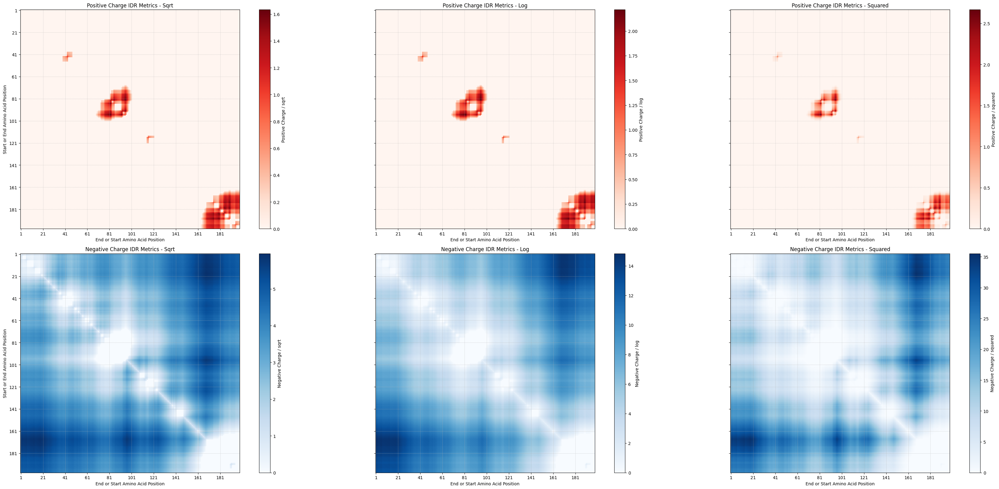

IDR Metric Analysis for Monosiga brevicollis|MONBRDRAFT_39241|A9VD53|IDR|123-320

Positive Charge Metrics:
Max Sqrt Metric: 1.63 at Start=180, End=185
Net Charge: 4, Length: 6, Metric: 1.63
Sequence: KKAAKK
Max Log Metric: 2.22 at Start=82, End=95
Net Charge: 6, Length: 14, Metric: 2.22
Sequence: KRGKGASNSNKRAK
Max Squared Metric: 2.67 at Start=180, End=185
Net Charge: 4, Length: 6, Metric: 2.67
Sequence: KKAAKK

Negative Charge Metrics:
Max Sqrt Metric: 5.96 at Start=19, End=168
Net Charge: -73, Length: 150, Metric: 5.96
Sequence: DSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEED
Max Log Metric: 14.83 at Start=2, End=168
Net Charge: -76, Length: 167, Metric: 14.83
Sequence: EQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEED
Max Squared Metric: 35.53 at Start=19, End=168


In [3]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read the first sequence from the FASTA file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f:
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())
sequence = sequences[0]  # Use the first sequence
name = names[0]

# Get disorder prediction and NCPR data
disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
positions = range(1, len(sequence) + 1)

try:
    SeqOb = SequenceParameters(sequence)
except:
    print(f"Error with sequence: {name}")
    sys.exit(1)
ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
ncpr_x = ncpr_data[0, :]
ncpr_y = ncpr_data[1, :]

# Function to calculate net charge for a region
def calculate_net_charge(sequence, start, end):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    charge_pos = sum(1 for aa in region if aa in 'RK')  # Positive (R, K)
    charge_neg = sum(1 for aa in region if aa in 'DE')  # Negative (D, E)
    return charge_pos - charge_neg

# Generate symmetric heatmap data for different metrics
max_len = len(sequence)
metrics = {
    'sqrt': lambda charge, length: abs(charge) / np.sqrt(length),
    'log': lambda charge, length: abs(charge) / np.log(length + 1),  # +1 to avoid log(0)
    'squared': lambda charge, length: (charge ** 2) / length
}

heatmap_pos = {metric_name: np.zeros((max_len, max_len)) for metric_name in metrics}
heatmap_neg = {metric_name: np.zeros((max_len, max_len)) for metric_name in metrics}

for start in range(1, max_len + 1):
    for end in range(start, max_len + 1):  # Include start = end and end > start
        length = end - start + 1
        if length > 0:  # Avoid division by zero
            charge = calculate_net_charge(sequence, start, end)
            for metric_name, metric_func in metrics.items():
                normalized_metric = metric_func(charge, length)
                if charge > 0:
                    heatmap_pos[metric_name][start-1, end-1] = normalized_metric
                    if start != end:
                        heatmap_pos[metric_name][end-1, start-1] = normalized_metric
                elif charge < 0:
                    heatmap_neg[metric_name][start-1, end-1] = normalized_metric
                    if start != end:
                        heatmap_neg[metric_name][end-1, start-1] = normalized_metric

# Create figure with two rows (positive and negative) and three columns (metrics)
fig, axes = plt.subplots(2, 3, figsize=(36, 16), sharey='row')

# Titles for rows
row_titles = ['Positive Charge IDR Metrics', 'Negative Charge IDR Metrics']

# Plot heatmaps
for i, (charge_type, heatmaps) in enumerate([('pos', heatmap_pos), ('neg', heatmap_neg)]):
    for j, (metric_name, heatmap_data) in enumerate(heatmaps.items()):
        ax = axes[i, j]
        im = ax.imshow(heatmap_data, cmap='Reds' if charge_type == 'pos' else 'Blues', interpolation='nearest', aspect='equal')
        ax.set_title(f'{row_titles[i]} - {metric_name.capitalize()}')
        ax.set_xlabel('End or Start Amino Acid Position')
        if j == 0:
            ax.set_ylabel('Start or End Amino Acid Position')
        fig.colorbar(im, ax=ax, label=f'{"Positive" if charge_type == "pos" else "Negative"} Charge / {metric_name}')
        ax.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)

# Set ticks
for ax in axes.flat:
    ax.set_xticks(np.arange(0, max_len, 20))
    ax.set_xticklabels(np.arange(1, max_len + 1, 20))
    ax.set_yticks(np.arange(0, max_len, 20))
    ax.set_yticklabels(np.arange(1, max_len + 1, 20))

plt.tight_layout()


plt.show()

# Print insights for all metrics
print("="*80)
print(f"IDR Metric Analysis for {name}")
print("="*80)

for charge_type in ['pos', 'neg']:
    print(f"\n{'Positive' if charge_type == 'pos' else 'Negative'} Charge Metrics:")
    for metric_name in metrics.keys():
        heatmap_data = heatmap_pos if charge_type == 'pos' else heatmap_neg
        max_metric = np.max(heatmap_data[metric_name])
        max_pos = np.unravel_index(np.argmax(heatmap_data[metric_name]), heatmap_data[metric_name].shape)
        start_max, end_max = max_pos[0] + 1, max_pos[1] + 1
        charge_max = calculate_net_charge(sequence, min(start_max, end_max), max(start_max, end_max))
        length_max = max(end_max, start_max) - min(start_max, end_max) + 1
        metric_func = metrics[metric_name]
        metric_value = metric_func(charge_max, length_max) if (charge_max > 0 and charge_type == 'pos') or (charge_max < 0 and charge_type == 'neg') else 0
        print(f"Max {metric_name.capitalize()} Metric: {max_metric:.2f} at Start={min(start_max, end_max)}, End={max(start_max, end_max)}")
        print(f"Net Charge: {charge_max}, Length: {length_max}, Metric: {metric_value:.2f}")
        print(f"Sequence: {sequence[min(start_max, end_max)-1:max(end_max, start_max)]}")

print("\n" + "="*80)

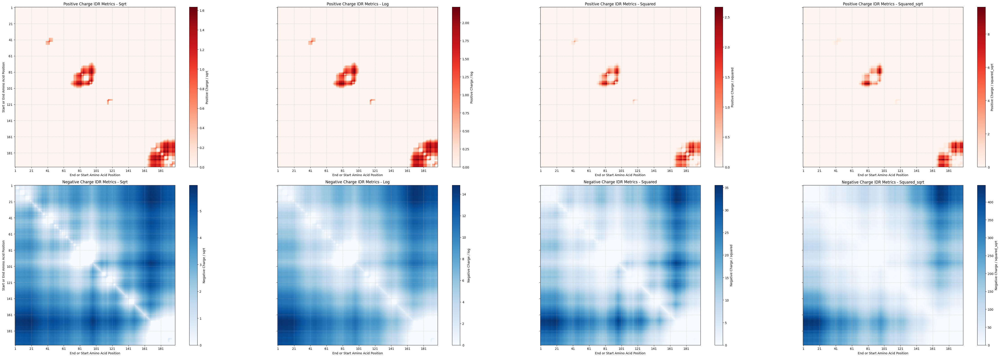

IDR Metric Analysis for Monosiga brevicollis|MONBRDRAFT_39241|A9VD53|IDR|123-320

Positive Charge Metrics:
Max Sqrt Metric: 1.63 at Start=180, End=185
Net Charge: 4, Length: 6, Metric: 1.63
Sequence: KKAAKK
Max Log Metric: 2.22 at Start=82, End=95
Net Charge: 6, Length: 14, Metric: 2.22
Sequence: KRGKGASNSNKRAK
Max Squared Metric: 2.67 at Start=180, End=185
Net Charge: 4, Length: 6, Metric: 2.67
Sequence: KKAAKK
Max Squared_sqrt Metric: 9.62 at Start=82, End=95
Net Charge: 6, Length: 14, Metric: 9.62
Sequence: KRGKGASNSNKRAK

Negative Charge Metrics:
Max Sqrt Metric: 5.96 at Start=19, End=168
Net Charge: -73, Length: 150, Metric: 5.96
Sequence: DSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEED
Max Log Metric: 14.83 at Start=2, End=168
Net Charge: -76, Length: 167, Metric: 14.83
Sequence: EQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDD

In [2]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read the first sequence from the FASTA file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f:
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())
sequence = sequences[0]  # Use the first sequence
name = names[0]

# Get disorder prediction and NCPR data
disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
positions = range(1, len(sequence) + 1)

try:
    SeqOb = SequenceParameters(sequence)
except:
    print(f"Error with sequence: {name}")
    sys.exit(1)
ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
ncpr_x = ncpr_data[0, :]
ncpr_y = ncpr_data[1, :]

# Function to calculate net charge for a region
def calculate_net_charge(sequence, start, end):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    charge_pos = sum(1 for aa in region if aa in 'RK')  # Positive (R, K)
    charge_neg = sum(1 for aa in region if aa in 'DE')  # Negative (D, E)
    return charge_pos - charge_neg

# Generate symmetric heatmap data for different metrics
max_len = len(sequence)
metrics = {
    'sqrt': lambda charge, length: abs(charge) / np.sqrt(length),
    'log': lambda charge, length: abs(charge) / np.log(length + 1),  # +1 to avoid log(0)
    'squared': lambda charge, length: (charge ** 2) / length,
    'squared_sqrt': lambda charge, length: (charge ** 2) / np.sqrt(length)  # New metric
}

heatmap_pos = {metric_name: np.zeros((max_len, max_len)) for metric_name in metrics}
heatmap_neg = {metric_name: np.zeros((max_len, max_len)) for metric_name in metrics}

for start in range(1, max_len + 1):
    for end in range(start, max_len + 1):  # Include start = end and end > start
        length = end - start + 1
        if length > 0:  # Avoid division by zero
            charge = calculate_net_charge(sequence, start, end)
            for metric_name, metric_func in metrics.items():
                normalized_metric = metric_func(charge, length)
                if charge > 0:
                    heatmap_pos[metric_name][start-1, end-1] = normalized_metric
                    if start != end:
                        heatmap_pos[metric_name][end-1, start-1] = normalized_metric
                elif charge < 0:
                    heatmap_neg[metric_name][start-1, end-1] = normalized_metric
                    if start != end:
                        heatmap_neg[metric_name][end-1, start-1] = normalized_metric

# Create figure with two rows (positive and negative) and four columns (metrics)
fig, axes = plt.subplots(2, 4, figsize=(48, 16), sharey='row')

# Titles for rows
row_titles = ['Positive Charge IDR Metrics', 'Negative Charge IDR Metrics']

# Plot heatmaps
for i, (charge_type, heatmaps) in enumerate([('pos', heatmap_pos), ('neg', heatmap_neg)]):
    for j, (metric_name, heatmap_data) in enumerate(heatmaps.items()):
        ax = axes[i, j]
        im = ax.imshow(heatmap_data, cmap='Reds' if charge_type == 'pos' else 'Blues', interpolation='nearest', aspect='equal')
        ax.set_title(f'{row_titles[i]} - {metric_name.capitalize()}')
        ax.set_xlabel('End or Start Amino Acid Position')
        if j == 0:
            ax.set_ylabel('Start or End Amino Acid Position')
        fig.colorbar(im, ax=ax, label=f'{"Positive" if charge_type == "pos" else "Negative"} Charge / {metric_name}')
        ax.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)

# Set ticks
for ax in axes.flat:
    ax.set_xticks(np.arange(0, max_len, 20))
    ax.set_xticklabels(np.arange(1, max_len + 1, 20))
    ax.set_yticks(np.arange(0, max_len, 20))
    ax.set_yticklabels(np.arange(1, max_len + 1, 20))

plt.tight_layout()

# Save plots
plt.savefig(f"/home/ilnitsky/NPM/45_Species/{name}_idr_metric_heatmap_all.png", dpi=300, bbox_inches='tight')
plt.savefig(f"/home/ilnitsky/NPM/45_Species/{name}_idr_metric_heatmap_all.pdf", bbox_inches='tight')
plt.show()

# Print insights for all metrics
print("="*80)
print(f"IDR Metric Analysis for {name}")
print("="*80)

for charge_type in ['pos', 'neg']:
    print(f"\n{'Positive' if charge_type == 'pos' else 'Negative'} Charge Metrics:")
    for metric_name in metrics.keys():
        heatmap_data = heatmap_pos if charge_type == 'pos' else heatmap_neg
        max_metric = np.max(heatmap_data[metric_name])
        max_pos = np.unravel_index(np.argmax(heatmap_data[metric_name]), heatmap_data[metric_name].shape)
        start_max, end_max = max_pos[0] + 1, max_pos[1] + 1
        charge_max = calculate_net_charge(sequence, min(start_max, end_max), max(start_max, end_max))
        length_max = max(end_max, start_max) - min(start_max, end_max) + 1
        metric_func = metrics[metric_name]
        metric_value = metric_func(charge_max, length_max) if (charge_max > 0 and charge_type == 'pos') or (charge_max < 0 and charge_type == 'neg') else 0
        print(f"Max {metric_name.capitalize()} Metric: {max_metric:.2f} at Start={min(start_max, end_max)}, End={max(start_max, end_max)}")
        print(f"Net Charge: {charge_max}, Length: {length_max}, Metric: {metric_value:.2f}")
        print(f"Sequence: {sequence[min(start_max, end_max)-1:max(end_max, start_max)]}")

print("\n" + "="*80)

In [11]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read all sequences from the FASTA file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f:
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())

# Process each sequence
for sequence, name in zip(sequences, names):
    # Get disorder prediction and NCPR data
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    positions = range(1, len(sequence) + 1)

    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]

    # Function to calculate net charge for a region
    def calculate_net_charge(sequence, start, end):
        region = sequence[start-1:end]  # 0-based indexing adjustment
        charge_pos = sum(1 for aa in region if aa in 'RK')  # Positive (R, K)
        charge_neg = sum(1 for aa in region if aa in 'DE')  # Negative (D, E)
        return charge_pos - charge_neg

    # Generate symmetric heatmap data for different metrics
    max_len = len(sequence)
    metrics = {
        'sqrt': lambda charge, length: abs(charge) / np.sqrt(length),
        'log': lambda charge, length: abs(charge) / np.log(length + 1),  # +1 to avoid log(0)
        'squared': lambda charge, length: (charge ** 2) / length
    }

    heatmap_pos = {metric_name: np.zeros((max_len, max_len)) for metric_name in metrics}
    heatmap_neg = {metric_name: np.zeros((max_len, max_len)) for metric_name in metrics}

    for start in range(1, max_len + 1):
        for end in range(start, max_len + 1):  # Include start = end and end > start
            length = end - start + 1
            if length > 0:  # Avoid division by zero
                charge = calculate_net_charge(sequence, start, end)
                for metric_name, metric_func in metrics.items():
                    normalized_metric = metric_func(charge, length)
                    if charge > 0:
                        heatmap_pos[metric_name][start-1, end-1] = normalized_metric
                        if start != end:
                            heatmap_pos[metric_name][end-1, start-1] = normalized_metric
                    elif charge < 0:
                        heatmap_neg[metric_name][start-1, end-1] = normalized_metric
                        if start != end:
                            heatmap_neg[metric_name][end-1, start-1] = normalized_metric

    # Create figure with two rows (positive and negative) and three columns (metrics) for each sequence
    fig, axes = plt.subplots(2, 3, figsize=(36, 16), sharey='row')

    # Titles for rows
    row_titles = ['Positive Charge IDR Metrics', 'Negative Charge IDR Metrics']

    # Plot heatmaps and annotate selected regions for each metric
    for i, (charge_type, heatmaps) in enumerate([('pos', heatmap_pos), ('neg', heatmap_neg)]):
        for j, (metric_name, heatmap_data) in enumerate(heatmaps.items()):
            ax = axes[i, j]
            im = ax.imshow(heatmap_data, cmap='Reds' if charge_type == 'pos' else 'Blues', interpolation='nearest', aspect='equal')
            ax.set_title(f'{row_titles[i]} - {metric_name.capitalize()}')
            ax.set_xlabel('End or Start Amino Acid Position')
            if j == 0:
                ax.set_ylabel('Start or End Amino Acid Position')
            fig.colorbar(im, ax=ax, label=f'{"Positive" if charge_type == "pos" else "Negative"} Charge / {metric_name}')
            ax.grid(True, which="both", linestyle='--', linewidth=0.5, alpha=0.7)

            # Annotate the region with the maximum metric for this specific metric
            max_metric = np.max(heatmap_data)
            max_pos = np.unravel_index(np.argmax(heatmap_data), heatmap_data.shape)
            start_max, end_max = max_pos[0] + 1, max_pos[1] + 1
            region_seq = sequence[min(start_max, end_max)-1:max(end_max, start_max)]
            charge = calculate_net_charge(sequence, min(start_max, end_max), max(start_max, end_max))
            ax.text(end_max-1, start_max-1, f'{start_max}-{end_max}\n{region_seq[:10]}...',
                    ha='center', va='center', color='white', fontsize=8, bbox=dict(facecolor='black', alpha=0.7))
            ax.plot([start_max-1, end_max-1], [start_max-1, end_max-1], 'w-', lw=2)  # Highlight region

    # Set ticks
    for ax in axes.flat:
        ax.set_xticks(np.arange(0, max_len, 20))
        ax.set_xticklabels(np.arange(1, max_len + 1, 20))
        ax.set_yticks(np.arange(0, max_len, 20))
        ax.set_yticklabels(np.arange(1, max_len + 1, 20))

    plt.tight_layout()

    # Save plots for each sequence
    plt.savefig(f"/home/ilnitsky/NPM/45_Species/{name}_idr_metric_heatmap_annotated.png", dpi=300, bbox_inches='tight')
    plt.savefig(f"/home/ilnitsky/NPM/45_Species/{name}_idr_metric_heatmap_annotated.pdf", bbox_inches='tight')
    plt.close(fig)  # Close the figure to free memory

    # Print insights for all metrics and selected polyelectrolyte IDRs
    print("="*80)
    print(f"IDR Metric Analysis for {name}")
    print("="*80)

    for charge_type in ['pos', 'neg']:
        print(f"\n{'Positive' if charge_type == 'pos' else 'Negative'} Charge Metrics:")
        for metric_name in metrics.keys():
            heatmap_data = heatmap_pos if charge_type == 'pos' else heatmap_neg
            max_metric = np.max(heatmap_data[metric_name])
            max_pos = np.unravel_index(np.argmax(heatmap_data[metric_name]), heatmap_data[metric_name].shape)
            start_max, end_max = max_pos[0] + 1, max_pos[1] + 1
            charge_max = calculate_net_charge(sequence, min(start_max, end_max), max(start_max, end_max))
            length_max = max(end_max, start_max) - min(start_max, end_max) + 1
            metric_func = metrics[metric_name]
            metric_value = metric_func(charge_max, length_max) if (charge_max > 0 and charge_type == 'pos') or (charge_max < 0 and charge_type == 'neg') else 0
            print(f"Max {metric_name.capitalize()} Metric: {max_metric:.2f} at Start={min(start_max, end_max)}, End={max(start_max, end_max)}")
            print(f"Net Charge: {charge_max}, Length: {length_max}, Metric: {metric_value:.2f}")
            print(f"Sequence: {sequence[min(start_max, end_max)-1:max(end_max, start_max)]}")

    # Select and print polyelectrolyte IDR regions for all metrics
    print("\n" + "="*80)
    print("Selected Polyelectrolyte IDR Regions")
    print("="*80)

    for metric_name in metrics.keys():
        # Positive polyelectrolyte IDR
        max_pos_metric = np.max(heatmap_pos[metric_name])
        max_pos_pos = np.unravel_index(np.argmax(heatmap_pos[metric_name]), heatmap_pos[metric_name].shape)
        start_pos_max, end_pos_max = max_pos_pos[0] + 1, max_pos_pos[1] + 1
        pos_region_seq = sequence[min(start_pos_max, end_pos_max)-1:max(end_pos_max, start_pos_max)]
        charge_pos = calculate_net_charge(sequence, min(start_pos_max, end_pos_max), max(start_pos_max, end_pos_max))
        print(f"Positive Polyelectrolyte IDR ({metric_name.capitalize()}): {start_pos_max}-{end_pos_max}")
        print(f"Sequence: {pos_region_seq}")
        print(f"Net Charge: {charge_pos}")

        # Negative polyelectrolyte IDR
        max_neg_metric = np.max(heatmap_neg[metric_name])
        max_neg_pos = np.unravel_index(np.argmax(heatmap_neg[metric_name]), heatmap_neg[metric_name].shape)
        start_neg_max, end_neg_max = max_neg_pos[0] + 1, max_neg_pos[1] + 1
        neg_region_seq = sequence[min(start_neg_max, end_neg_max)-1:max(end_neg_max, start_neg_max)]
        charge_neg = calculate_net_charge(sequence, min(start_neg_max, end_neg_max), max(start_neg_max, end_neg_max))
        print(f"\nNegative Polyelectrolyte IDR ({metric_name.capitalize()}): {start_neg_max}-{end_neg_max}")
        print(f"Sequence: {neg_region_seq}")
        print(f"Net Charge: {charge_neg}")

    print("\n" + "="*80)

IDR Metric Analysis for Homo sapiens|NPM1|P06748|IDR|118-244

Positive Charge Metrics:
Max Sqrt Metric: 1.54 at Start=72, End=122
Net Charge: 11, Length: 51, Metric: 1.54
Sequence: KAPVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQESFKKQEKTPKTPK
Max Log Metric: 2.78 at Start=72, End=122
Net Charge: 11, Length: 51, Metric: 2.78
Sequence: KAPVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQESFKKQEKTPKTPK
Max Squared Metric: 2.37 at Start=72, End=122
Net Charge: 11, Length: 51, Metric: 2.37
Sequence: KAPVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQESFKKQEKTPKTPK

Negative Charge Metrics:
Max Sqrt Metric: 4.91 at Start=44, End=71
Net Charge: -26, Length: 28, Metric: 4.91
Sequence: DEDDDDDDEEDDDEDDDDDDFDDEEAEE
Max Log Metric: 7.72 at Start=44, End=71
Net Charge: -26, Length: 28, Metric: 7.72
Sequence: DEDDDDDDEEDDDEDDDDDDFDDEEAEE
Max Squared Metric: 24.14 at Start=44, End=71
Net Charge: -26, Length: 28, Metric: 24.14
Sequence: DEDDDDDDEEDDDEDDDDDDFDDEEAEE

Selected Polyelectrolyte IDR Regions
Positive Polyelectrolyte IDR (Sqrt):

STRUCTURED & IDR REGIONS (Window=4, Median<0.6, Length>30; IDR Threshold=1.0 for squared charge / sqrt(length))

Homo sapiens|NPM1|P06748|IDR|118-244
------------------------------------
No structured regions >30aa
+IDR 72-122 (Metric: 16.94) KAPVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQESFKKQEKTPKTPK
+IDR 17-40 (Metric: 10.00) KLLSISGKRSAPGGGSKVPQKKVK
-IDR 44-71 (Metric: 127.75) DEDDDDDDEEDDDEDDDDDDFDDEEAEE
-IDR 3-15 (Metric: 33.56) EEDAESEDEEEED

Gallus gallus|NPM1|P16039|IDR|120-244
-------------------------------------
No structured regions >30aa
+IDR 69-120 (Metric: 19.97) KTPMKKPAREPAGKNMQKAKQNGKDSKPSTPASKTKTPDSKKDKSLTPKTPK
+IDR 16-39 (Metric: 10.00) KIGNASTKRPASGGGAKTPQKKPK
-IDR 42-67 (Metric: 122.57) EDDEDDDEDEDDDEDDEDDLDDDEEE
-IDR 3-14 (Metric: 28.87) EEEPESEDEEED

Anolis carolinensis|npm1|G1KRE8|IDR|118-246
-------------------------------------------
No structured regions >30aa
+IDR 75-125 (Metric: 20.16) KTPVKKPARDLAVKKTQKSNQNGKDSKPTTPKQKTPETHKEKKPQTPKTPK
+IDR 15-38 (Metric: 10.00) 

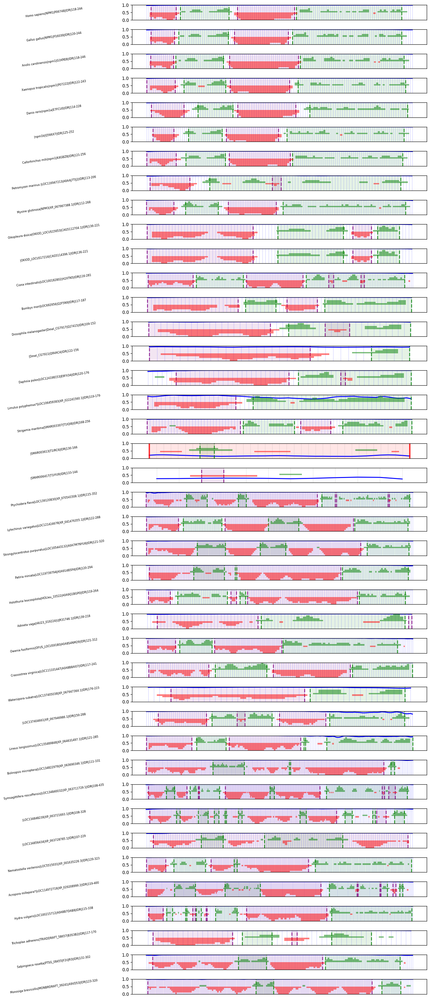

In [4]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
from ete3 import NCBITaxa
import random
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read clustered fasta file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f: 
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())

sequences4plot = sequences
names4plot = names

# SLIDING WINDOW FUNCTION for structured regions
def get_structured_regions(disorder_scores, sequence, window=4, threshold=0.6, min_length=30):
    positions = range(1, len(sequence) + 1)
    structured_mask = []
    
    for i in range(len(disorder_scores)):
        start = max(0, i - window + 1)
        end = min(len(disorder_scores), i + 1)
        window_scores = disorder_scores[start:end]
        median_score = np.median(window_scores)
        structured_mask.append(median_score < threshold)
    
    structured_regions = []
    in_region = False
    start_pos = None
    
    for pos, is_structured in zip(positions, structured_mask):
        if is_structured and not in_region:
            in_region = True
            start_pos = pos
        elif not is_structured and in_region:
            end_pos = pos - 1
            length = end_pos - start_pos + 1
            if length >= min_length:
                seq_region = sequence[start_pos-1:end_pos]
                structured_regions.append((start_pos, end_pos, length, seq_region))
            in_region = False
    
    if in_region:
        end_pos = len(sequence)
        length = end_pos - start_pos + 1
        if length >= min_length:
            seq_region = sequence[start_pos-1:end_pos]
            structured_regions.append((start_pos, end_pos, length, seq_region))
    
    return structured_regions

# FUNCTION TO GET IDR REGIONS BASED ON SQUARED CHARGE / SQRT(LENGTH), excluding structured domains and overlapping regions
def get_idr_regions(sequence, structured_regions, threshold=1.0):
    max_len = len(sequence)
    idr_regions = {"positive": [], "negative": []}
    
    # Convert structured regions to a set of positions
    structured_positions = set()
    for start, end, _, _ in structured_regions:
        structured_positions.update(range(start, end + 1))
    
    # Calculate squared charge / sqrt(length) for all pairs
    for start in range(1, max_len + 1):
        for end in range(start, max_len + 1):
            if end - start + 1 > 0 and (start, end) not in structured_positions:  # Avoid zero length and structured regions
                length = end - start + 1
                charge = calculate_net_charge(sequence, start, end)
                metric = (charge ** 2) / np.sqrt(length)
                region_seq = sequence[start-1:end]
                
                # Check if the region is outside structured domains
                is_structured = any(start <= s_start <= end or start <= s_end <= end for s_start, s_end, _, _ in structured_regions)
                if not is_structured and metric > threshold:
                    if charge > 0:
                        idr_regions["positive"].append((start, end, region_seq, metric))
                    elif charge < 0:
                        idr_regions["negative"].append((start, end, region_seq, metric))
    
    # Filter out overlapping regions
    def filter_non_overlapping(regions):
        non_overlapping = []
        for r1 in sorted(regions, key=lambda x: x[3], reverse=True):  # Sort by metric
            overlap = False
            for r2 in non_overlapping:
                if not (r1[1] < r2[0] or r1[0] > r2[1]):  # Check for overlap
                    overlap = True
                    break
            if not overlap:
                non_overlapping.append(r1)
        return non_overlapping

    idr_regions["positive"] = filter_non_overlapping(idr_regions["positive"])
    idr_regions["negative"] = filter_non_overlapping(idr_regions["negative"])
    
    return idr_regions

# Function to calculate net charge for a region
def calculate_net_charge(sequence, start, end):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    charge_pos = sum(1 for aa in region if aa in 'RK')  # Positive (R, K)
    charge_neg = sum(1 for aa in region if aa in 'DE')  # Negative (D, E)
    return charge_pos - charge_neg

fig, axs = plt.subplots(len(sequences4plot), 1, figsize=(12, 0.75*len(sequences4plot)), squeeze=False)
axs = axs.ravel()

# PRINT SECTIONS
print("="*80)
print("STRUCTURED & IDR REGIONS (Window=4, Median<0.6, Length>30; IDR Threshold=1.0 for squared charge / sqrt(length))")
print("="*80)

for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(f"\n{name}")
    print("-"*len(name))
    
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    structured_regions = get_structured_regions(disorder_prediction, sequence)
    
    # Get NCPR data (for reference, though not used for IDR detection here)
    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]
    
    idr_regions = get_idr_regions(sequence, structured_regions)
    
    # Print structured regions
    if structured_regions:
        for start, end, length, seq_region in structured_regions:
            print(f"Domain {start}-{end} ({length}aa) {seq_region}")
    else:
        print("No structured regions >30aa")
    
    # Print IDR regions
    if idr_regions["positive"]:
        for start, end, seq_region, metric in idr_regions["positive"]:
            print(f"+IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")
    if idr_regions["negative"]:
        for start, end, seq_region, metric in idr_regions["negative"]:
            print(f"-IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")

print("\n" + "="*80)

# PLOTTING
for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(i, name)
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    positions = range(1, len(sequence) + 1)
    structured_regions = get_structured_regions(disorder_prediction, sequence)
    
    # Get NCPR data (for reference)
    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]
    idr_regions = get_idr_regions(sequence, structured_regions)

    # Create twin axes
    ax1 = axs[i]
    ax2 = ax1.twinx()

    # PLOT 1: Disorder score (line)
    ax1.plot(positions, disorder_prediction, 'b-', linewidth=2)

    # PLOT 2: VERTICAL LINES for each position (individual disorder >0.6 = blue)
    for pos, disorder in zip(positions, disorder_prediction):
        color = 'blue' if disorder > 0.6 else 'gray'
        alpha = 0.3
        ax1.axvline(x=pos, color=color, alpha=alpha, linewidth=0.5)

    # PLOT 3: RED BORDERS for structured regions (window median <0.6)
    for start, end, length, _ in structured_regions:
        ax1.axvline(x=start, color='red', linewidth=3, alpha=0.8)
        ax1.axvline(x=end, color='red', linewidth=3, alpha=0.8)
        ax1.axvspan(start, end, color='red', alpha=0.1)

    # PLOT 4: IDR BORDERS based on squared charge / sqrt(length)
    for start, end, _, _ in idr_regions["positive"]:
        ax1.axvline(x=start, color='green', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvline(x=end, color='green', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvspan(start, end, color='green', alpha=0.1)
    for start, end, _, _ in idr_regions["negative"]:
        ax1.axvline(x=start, color='purple', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvline(x=end, color='purple', linewidth=2, alpha=0.8, linestyle='--')
        ax1.axvspan(start, end, color='purple', alpha=0.1)

    # Plot NCPR (bars) for reference
    for j in range(len(ncpr_x)):
        color = 'green' if ncpr_y[j] >= 0 else 'red'
        ax2.bar(ncpr_x[j], ncpr_y[j], width=1, color=color, alpha=0.5, align='center')

    # Set axis properties
    ax1.set_ylim([0, 1])
    ax2.set_ylim([-1.0, 1.0])
    ax1.set_xticks([])
    ax2.set_xticks([])
    ax1.set_yticks([0, 0.5, 1])
    ax2.set_yticks([])
    
    ax1.set_ylabel(name, color='black', rotation=8, labelpad=150, va='center', fontsize=6)

plt.tight_layout()
plt.gcf().set_size_inches(14, 0.75*len(sequences4plot))

# Save plots
plt.show()

In [4]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from localcider.sequenceParameters import SequenceParameters
from ete3 import NCBITaxa
import random
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# Read clustered fasta file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f: 
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())

sequences4plot = sequences
names4plot = names

# SLIDING WINDOW FUNCTION for structured regions
def get_structured_regions(disorder_scores, sequence, window=4, threshold=0.6, min_length=30):
    if len(disorder_scores) != len(sequence):
        print(f"Warning: Disorder scores length ({len(disorder_scores)}) does not match sequence length ({len(sequence)}). Truncating to match.")
        disorder_scores = disorder_scores[:len(sequence)]
    positions = range(1, len(sequence) + 1)
    structured_mask = []
    
    for i in range(len(disorder_scores)):
        start = max(0, i - window + 1)
        end = min(len(disorder_scores), i + 1)
        window_scores = disorder_scores[start:end]
        median_score = np.median(window_scores)
        structured_mask.append(median_score < threshold)
    
    structured_regions = []
    in_region = False
    start_pos = None
    
    for pos, is_structured in zip(positions, structured_mask):
        if is_structured and not in_region:
            in_region = True
            start_pos = pos
        elif not is_structured and in_region:
            end_pos = pos - 1
            length = end_pos - start_pos + 1
            if length >= min_length:
                seq_region = sequence[start_pos-1:end_pos]
                structured_regions.append((start_pos, end_pos, length, seq_region))
            in_region = False
    
    if in_region:
        end_pos = len(sequence)
        length = end_pos - start_pos + 1
        if length >= min_length:
            seq_region = sequence[start_pos-1:end_pos]
            structured_regions.append((start_pos, end_pos, length, seq_region))
    
    return structured_regions

# FUNCTION TO GET IDR REGIONS AND METRIC PROFILES
def get_idr_regions_and_profiles(sequence, structured_regions, threshold=1.0, min_length=7):
    max_len = len(sequence)
    idr_regions = {"sqrt": {"positive": [], "negative": []},
                   "log": {"positive": [], "negative": []},
                   "squared": {"positive": [], "negative": []},
                   "squared_sqrt": {"positive": [], "negative": []}}
    profiles = {
        'sqrt': np.zeros(max_len),
        'log': np.zeros(max_len),
        'squared': np.zeros(max_len),
        'squared_sqrt': np.zeros(max_len)
    }
    
    # Convert structured regions to a set of positions
    structured_positions = set()
    for start, end, _, _ in structured_regions:
        structured_positions.update(range(start, end + 1))
    
    # Calculate metrics for all pairs and build profiles
    for start in range(1, max_len + 1):
        for end in range(start, max_len + 1):
            if end - start + 1 > 0 and start not in structured_positions:  # Avoid zero length and structured starts
                length = end - start + 1
                charge = calculate_net_charge(sequence, start, end)
                region_seq = sequence[start-1:end]
                
                # Check if the region is outside structured domains
                is_structured = any(start <= s_start <= end or start <= s_end <= end for s_start, s_end, _, _ in structured_regions)
                if not is_structured and length >= min_length:
                    # Compute all metrics
                    metrics = {
                        'sqrt': abs(charge) / np.sqrt(length),
                        'log': abs(charge) / np.log(length + 1),
                        'squared': (charge ** 2) / length,
                        'squared_sqrt': (charge ** 2) / np.sqrt(length)
                    }
                    for metric_name, metric_value in metrics.items():
                        if charge > 0 and metric_value > profiles[metric_name][start-1]:
                            profiles[metric_name][start-1] = metric_value
                        elif charge < 0 and metric_value > profiles[metric_name][start-1]:
                            profiles[metric_name][start-1] = metric_value
                        
                        # IDR detection based on each metric's profile value
                        if metric_value > threshold:
                            if charge > 0:
                                idr_regions[metric_name]["positive"].append((start, end, region_seq, metric_value))
                            elif charge < 0:
                                idr_regions[metric_name]["negative"].append((start, end, region_seq, metric_value))
    
    # Debug: Check if IDRs were detected for any metric
    for metric_name in idr_regions:
        if not idr_regions[metric_name]["positive"] and not idr_regions[metric_name]["negative"]:
            print(f"Warning: No IDRs detected for {sequence[:20]}... (len={len(sequence)}) using {metric_name} metric. Check charge distribution or threshold ({threshold}).")
    
    # Filter out overlapping and handle nested splitting for each metric
    for metric_name in idr_regions:
        def filter_and_split_regions(pos_regions, neg_regions):
            all_regions = pos_regions + neg_regions
            non_overlapping = []
            
            while all_regions:
                r1 = max(all_regions, key=lambda x: x[3])  # Select region with highest metric
                all_regions.remove(r1)
                start1, end1, seq1, metric1 = r1
                overlap = False
                
                for r2 in non_overlapping:
                    start2, end2, _, _ = r2
                    if not (end1 < start2 or start1 > end2):  # Check for overlap
                        overlap = True
                        # If r1 is larger and contains r2 of opposite charge, split r1
                        if (start1 <= start2 and end1 >= end2) and (
                            (r1 in pos_regions and r2 in neg_regions) or (r1 in neg_regions and r2 in pos_regions)
                        ):
                            if start1 < start2:
                                new_seq = sequence[start1-1:start2-1]
                                new_metric = (calculate_net_charge(sequence, start1, start2-1) ** 2) / np.sqrt(start2 - start1) if metric_name == 'squared_sqrt' else abs(calculate_net_charge(sequence, start1, start2-1)) / (np.sqrt(start2 - start1) if metric_name == 'sqrt' else np.log(start2 - start1 + 1) if metric_name == 'log' else (start2 - start1))
                                if new_metric > threshold and len(new_seq) >= min_length:
                                    all_regions.append((start1, start2-1, new_seq, new_metric))
                            if end1 > end2:
                                new_seq = sequence[end2:end1]
                                new_metric = (calculate_net_charge(sequence, end2+1, end1) ** 2) / np.sqrt(end1 - end2) if metric_name == 'squared_sqrt' else abs(calculate_net_charge(sequence, end2+1, end1)) / (np.sqrt(end1 - end2) if metric_name == 'sqrt' else np.log(end1 - end2 + 1) if metric_name == 'log' else (end1 - end2))
                                if new_metric > threshold and len(new_seq) >= min_length:
                                    all_regions.append((end2+1, end1, new_seq, new_metric))
                        break
                
                if not overlap:
                    non_overlapping.append(r1)
            
            return {'positive': [r for r in non_overlapping if r in pos_regions], 
                    'negative': [r for r in non_overlapping if r in neg_regions]}

        idr_regions[metric_name] = filter_and_split_regions(idr_regions[metric_name]["positive"], idr_regions[metric_name]["negative"])
    
    return idr_regions, profiles

# Function to calculate net charge for a region
def calculate_net_charge(sequence, start, end):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    charge_pos = sum(1 for aa in region if aa in 'RK')  # Positive (R, K)
    charge_neg = sum(1 for aa in region if aa in 'DE')  # Negative (D, E)
    return charge_pos - charge_neg

fig, axs = plt.subplots(len(sequences4plot), 4, figsize=(48, 4*len(sequences4plot)), squeeze=False)
axs = axs.ravel()

# PRINT SECTIONS
print("="*80)
print("STRUCTURED & IDR REGIONS (Window=4, Median<0.6, Length>30; IDR Threshold=1.0 for each metric, Min Length=7aa)")
print("="*80)

for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(f"\n{name}")
    print("-"*len(name))
    
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    structured_regions = get_structured_regions(disorder_prediction, sequence)
    
    # Get NCPR data and IDR regions with profiles
    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]
    
    idr_regions, profiles = get_idr_regions_and_profiles(sequence, structured_regions)
    
    # Print structured regions
    if structured_regions:
        for start, end, length, seq_region in structured_regions:
            print(f"Domain {start}-{end} ({length}aa) {seq_region}")
    else:
        print("No structured regions >30aa")
    
    # Print IDR regions for each metric
    for metric_name in idr_regions:
        print(f"\n{metric_name.upper()} Metric IDRs:")
        if idr_regions[metric_name]["positive"]:
            for start, end, seq_region, metric in idr_regions[metric_name]["positive"]:
                print(f"+IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")
        if idr_regions[metric_name]["negative"]:
            for start, end, seq_region, metric in idr_regions[metric_name]["negative"]:
                print(f"-IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")

print("\n" + "="*80)

# PLOTTING
for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(i, name)
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    positions = range(1, len(sequence) + 1)
    structured_regions = get_structured_regions(disorder_prediction, sequence)
    
    # Get NCPR data and IDR regions with profiles
    try:
        SeqOb = SequenceParameters(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    ncpr_data = SeqOb.get_linear_NCPR(blobLen=5)
    ncpr_x = ncpr_data[0, :]
    ncpr_y = ncpr_data[1, :]
    idr_regions, profiles = get_idr_regions_and_profiles(sequence, structured_regions)

    # Plot for each metric profile
    for j, metric_name in enumerate(['sqrt', 'log', 'squared', 'squared_sqrt']):
        ax = axs[i * 4 + j]
        ax2 = ax.twinx()

        # PLOT 2: VERTICAL LINES for disorder (individual disorder >0.6 = blue)
        for pos, disorder in zip(positions, disorder_prediction):
            color = 'blue' if disorder > 0.6 else 'gray'
            alpha = 0.3
            ax.axvline(x=pos, color=color, alpha=alpha, linewidth=0.5)

        # PLOT 3: RED BORDERS for structured regions
        for start, end, length, _ in structured_regions:
            ax.axvline(x=start, color='red', linewidth=3, alpha=0.8)
            ax.axvline(x=end, color='red', linewidth=3, alpha=0.8)
            ax.axvspan(start, end, color='red', alpha=0.1)

        # PLOT 4: IDR BORDERS specific to each metric
        for start, end, _, _ in idr_regions[metric_name]["positive"]:
            ax.axvline(x=start, color='green', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvline(x=end, color='green', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvspan(start, end, color='green', alpha=0.1)
        for start, end, _, _ in idr_regions[metric_name]["negative"]:
            ax.axvline(x=start, color='purple', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvline(x=end, color='purple', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvspan(start, end, color='purple', alpha=0.1)

        # PLOT 5: NCPR (bars) for reference
        for j in range(len(ncpr_x)):
            color = 'green' if ncpr_y[j] >= 0 else 'red'
            ax2.bar(ncpr_x[j], ncpr_y[j], width=1, color=color, alpha=0.5, align='center')

        # Set axis properties
        ax.set_ylim([0, 1])  # Adjusted to focus on disorder and IDR visualization
        ax2.set_ylim([-1.0, 1.0])
        ax.set_xticks([])
        ax2.set_xticks([])
        ax.set_yticks([0, 0.5, 1])
        ax2.set_yticks([])
        
        ax.set_title(f'{name} - {metric_name.capitalize()} Profile')
        ax.set_ylabel('Disorder Score', color='black')
        if j == 0:
            ax.legend(['Disorder'], loc='upper right')

plt.tight_layout()
plt.gcf().set_size_inches(48, 4*len(sequences4plot))

# Save plots
plt.show()

STRUCTURED & IDR REGIONS (Window=4, Median<0.6, Length>30; IDR Threshold=1.0 for each metric, Min Length=7aa)

Monosiga brevicollis|MONBRDRAFT_39241|A9VD53|IDR|123-320
--------------------------------------------------------
No structured regions >30aa

SQRT Metric IDRs:
+IDR 180-189 (Metric: 1.58) KKAAKKTAAK
-IDR 19-168 (Metric: 5.96) DSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEED

LOG Metric IDRs:
+IDR 175-189 (Metric: 2.16) KTPVTKKAAKKTAAK
-IDR 2-168 (Metric: 14.83) EQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEED

SQUARED Metric IDRs:
+IDR 180-189 (Metric: 2.50) KKAAKKTAAK
-IDR 19-168 (Metric: 35.53) DSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEED

SQUARED_SQRT 

In [20]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# PARAMETERS
threshold_positive = 1.0  # Threshold for positive IDR detection
threshold_negative = 3.0  # Threshold for negative IDR detection
min_length = 7          # Minimum length for IDR regions
pH = 7.0                # pH for charge calculation
max_gap = 20            # Maximum gap to connect similar charge IDRs
charge_window_size = 6  # Sliding window size for charge/NCPR calculation
max_region_length = 70  # Maximum length of regions to analyze

# Read clustered fasta file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f: 
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())

sequences4plot = sequences
names4plot = names

# Function to calculate cumulative charge array
def calculate_cumulative_charge(sequence, pH=pH):
    pKa_values = {
        'D': 3.9,  # Aspartic acid
        'E': 4.3,  # Glutamic acid
        'H': 6.0,  # Histidine
        'C': 8.3,  # Cysteine
        'Y': 10.1, # Tyrosine
        'K': 10.5, # Lysine
        'R': 12.5  # Arginine
    }
    cumulative_charge = np.zeros(len(sequence) + 1)
    for i, aa in enumerate(sequence, 1):
        charge = 0.0
        if aa in pKa_values:
            if aa in ['D', 'E', 'H', 'C', 'Y']:
                fraction_deprotonated = 1 / (1 + 10**(pKa_values[aa] - pH))
                charge -= fraction_deprotonated
            elif aa in ['K', 'R']:
                fraction_protonated = 1 / (1 + 10**(pH - pKa_values[aa]))
                charge += fraction_protonated
        cumulative_charge[i] = cumulative_charge[i-1] + charge
    return cumulative_charge

# FUNCTION TO GET IDR REGIONS AND METRIC PROFILES
def get_idr_regions_and_profiles(sequence, threshold_positive=threshold_positive, threshold_negative=threshold_negative, min_length=min_length, pH=pH, max_gap=max_gap, charge_window_size=charge_window_size, max_region_length=max_region_length):
    max_len = len(sequence)
    idr_regions = {"sqrt": {"positive": [], "negative": []},
                   "squared_sqrt": {"positive": [], "negative": []},
                   "cbrt": {"positive": [], "negative": []}}
    profiles = {
        'sqrt': np.zeros(max_len),
        'squared_sqrt': np.zeros(max_len),
        'cbrt': np.zeros(max_len)
    }
    
    # Precompute cumulative charge
    cumulative_charge = calculate_cumulative_charge(sequence)
    
    # Calculate NCPR with sliding window
    ncpr_x = []
    ncpr_y = []
    for i in range(max_len - charge_window_size + 1):
        window_start = i + 1
        window_end = i + charge_window_size
        charge = cumulative_charge[window_end] - cumulative_charge[window_start - 1]
        ncpr = charge / charge_window_size
        ncpr_x.append(window_start + (charge_window_size - 1) / 2)  # Center of window
        ncpr_y.append(ncpr)
    
    # Calculate metrics for regions up to max_region_length
    for start in range(1, max_len + 1):
        for length in range(min_length, min(max_region_length + 1, max_len - start + 2)):
            end = start + length - 1
            charge = cumulative_charge[end] - cumulative_charge[start - 1]
            region_seq = sequence[start-1:end]
            
            # Compute all metrics
            metrics = {
                'sqrt': abs(charge) / np.sqrt(length),
                'squared_sqrt': (charge ** 2) / np.sqrt(length),
                'cbrt': abs(charge) / (length ** (1/3))
            }
            for metric_name, metric_value in metrics.items():
                if charge > 0 and metric_value > profiles[metric_name][start-1]:
                    profiles[metric_name][start-1] = metric_value
                elif charge < 0 and metric_value > profiles[metric_name][start-1]:
                    profiles[metric_name][start-1] = metric_value
                
                # IDR detection based on each metric's profile value with separate thresholds
                if charge > 0 and metric_value > threshold_positive:
                    idr_regions[metric_name]["positive"].append((start, end, region_seq, metric_value))
                elif charge < 0 and metric_value > threshold_negative:
                    idr_regions[metric_name]["negative"].append((start, end, region_seq, metric_value))
    
    # Debug: Check if IDRs were detected for any metric
    for metric_name in idr_regions:
        if not idr_regions[metric_name]["positive"] and not idr_regions[metric_name]["negative"]:
            print(f"Warning: No IDRs detected for {sequence[:20]}... (len={len(sequence)}) using {metric_name} metric. Check charge distribution or thresholds ({threshold_positive}/{threshold_negative}) at pH {pH}.")
    
    # Filter out overlapping and handle nested splitting for each metric
    for metric_name in idr_regions:
        def filter_and_split_regions(pos_regions, neg_regions):
            all_regions = pos_regions + neg_regions
            non_overlapping = []
            
            while all_regions:
                r1 = max(all_regions, key=lambda x: x[3])  # Select region with highest metric
                all_regions.remove(r1)
                start1, end1, seq1, metric1 = r1
                overlap = False
                
                for r2 in non_overlapping:
                    start2, end2, _, _ = r2
                    if not (end1 < start2 or start1 > end2):  # Check for overlap
                        overlap = True
                        # If r1 is larger and contains r2 of opposite charge, split r1
                        if (start1 <= start2 and end1 >= end2) and (
                            (r1 in pos_regions and r2 in neg_regions) or (r1 in neg_regions and r2 in pos_regions)
                        ):
                            if start1 < start2:
                                new_seq = sequence[start1-1:start2-1]
                                new_charge = cumulative_charge[start2-1] - cumulative_charge[start1-1]
                                new_length = start2 - start1
                                new_metric = (new_charge ** 2) / np.sqrt(new_length) if metric_name == 'squared_sqrt' else abs(new_charge) / (np.sqrt(new_length) if metric_name == 'sqrt' else new_length ** (1/3) if metric_name == 'cbrt' else new_length)
                                if new_metric > (threshold_positive if new_charge > 0 else threshold_negative) and len(new_seq) >= min_length:
                                    all_regions.append((start1, start2-1, new_seq, new_metric))
                            if end1 > end2:
                                new_seq = sequence[end2-1:end1]
                                new_charge = cumulative_charge[end1] - cumulative_charge[end2-1]
                                new_length = end1 - end2 + 1
                                new_metric = (new_charge ** 2) / np.sqrt(new_length) if metric_name == 'squared_sqrt' else abs(new_charge) / (np.sqrt(new_length) if metric_name == 'sqrt' else new_length ** (1/3) if metric_name == 'cbrt' else new_length)
                                if new_metric > (threshold_positive if new_charge > 0 else threshold_negative) and len(new_seq) >= min_length:
                                    all_regions.append((end2, end1, new_seq, new_metric))
                        break
                
                if not overlap:
                    non_overlapping.append(r1)
            
            return {'positive': [r for r in non_overlapping if r in pos_regions], 
                    'negative': [r for r in non_overlapping if r in neg_regions]}

        idr_regions[metric_name] = filter_and_split_regions(idr_regions[metric_name]["positive"], idr_regions[metric_name]["negative"])
    
    # Connect similar charge IDRs if gap is less than max_gap
    for metric_name in idr_regions:
        pos_regions = idr_regions[metric_name]["positive"]
        neg_regions = idr_regions[metric_name]["negative"]
        
        # Sort regions by start position
        pos_regions.sort(key=lambda x: x[0])
        neg_regions.sort(key=lambda x: x[0])
        
        # Connect positive regions
        i = 0
        while i < len(pos_regions) - 1:
            curr_end = pos_regions[i][1]
            next_start = pos_regions[i + 1][0]
            if next_start - curr_end <= max_gap:
                new_start = pos_regions[i][0]
                new_end = pos_regions[i + 1][1]
                new_seq = sequence[new_start-1:new_end]
                new_metric = max(pos_regions[i][3], pos_regions[i + 1][3])  # Use max metric value
                pos_regions[i] = (new_start, new_end, new_seq, new_metric)
                pos_regions.pop(i + 1)
            else:
                i += 1
        
        # Connect negative regions
        i = 0
        while i < len(neg_regions) - 1:
            curr_end = neg_regions[i][1]
            next_start = neg_regions[i + 1][0]
            if next_start - curr_end <= max_gap:
                new_start = neg_regions[i][0]
                new_end = neg_regions[i + 1][1]
                new_seq = sequence[new_start-1:new_end]
                new_metric = max(neg_regions[i][3], neg_regions[i + 1][3])  # Use max metric value
                neg_regions[i] = (new_start, new_end, new_seq, new_metric)
                neg_regions.pop(i + 1)
            else:
                i += 1
        
        idr_regions[metric_name]["positive"] = pos_regions
        idr_regions[metric_name]["negative"] = neg_regions
    
    return idr_regions, profiles, ncpr_x, ncpr_y

# Function to calculate net charge for a region using pKa and pH (used for validation, can be removed if cumulative_charge is sufficient)
def calculate_net_charge(sequence, start, end, pH=pH):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    net_charge = 0.0
    
    pKa_values = {
        'D': 3.9,  # Aspartic acid
        'E': 4.3,  # Glutamic acid
        'H': 6.0,  # Histidine
        'C': 8.3,  # Cysteine
        'Y': 10.1, # Tyrosine
        'K': 10.5, # Lysine
        'R': 12.5  # Arginine
    }
    
    for aa in region:
        if aa in pKa_values:
            if aa in ['D', 'E', 'H', 'C', 'Y']:
                fraction_deprotonated = 1 / (1 + 10**(pKa_values[aa] - pH))
                net_charge -= fraction_deprotonated
            elif aa in ['K', 'R']:
                fraction_protonated = 1 / (1 + 10**(pH - pKa_values[aa]))
                net_charge += fraction_protonated
    
    return net_charge

fig, axs = plt.subplots(len(sequences4plot), 3, figsize=(36, 4*len(sequences4plot)), squeeze=False)  # Changed to 3 columns
axs = axs.ravel()

# PRINT SECTIONS
print("="*80)
print(f"IDR REGIONS (Positive Threshold={threshold_positive}, Negative Threshold={threshold_negative} for each metric, Min Length={min_length}aa, pH={pH}, Max Gap={max_gap}, Charge Window Size={charge_window_size}, Max Region Length={max_region_length})")
print("="*80)

for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(f"\n{name}")
    print("-"*len(name))
    
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    
    # Get NCPR data and IDR regions with profiles
    try:
        idr_regions, profiles, ncpr_x, ncpr_y = get_idr_regions_and_profiles(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    
    # Print IDR regions for each metric
    for metric_name in idr_regions:
        print(f"\n{metric_name.upper()} Metric IDRs:")
        if idr_regions[metric_name]["positive"]:
            for start, end, seq_region, metric in idr_regions[metric_name]["positive"]:
                print(f"+IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")
        if idr_regions[metric_name]["negative"]:
            for start, end, seq_region, metric in idr_regions[metric_name]["negative"]:
                print(f"-IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")

print("\n" + "="*80)

# PLOTTING
for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(i, name)
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    positions = range(1, len(sequence) + 1)
    
    # Get NCPR data and IDR regions with profiles
    try:
        idr_regions, profiles, ncpr_x, ncpr_y = get_idr_regions_and_profiles(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue

    # Plot for each metric profile
    for j, metric_name in enumerate(['sqrt', 'squared_sqrt', 'cbrt']):
        ax = axs[i * 3 + j]  # Adjusted indexing for 3 columns

        # PLOT 2: VERTICAL LINES for disorder (individual disorder >0.6 = blue)
        for pos, disorder in zip(positions, disorder_prediction):
            color = 'blue' if disorder > 0.6 else 'gray'
            alpha = 0.3
            ax.axvline(x=pos, color=color, alpha=alpha, linewidth=0.5)

        # PLOT 4: IDR BORDERS specific to each metric
        for start, end, _, _ in idr_regions[metric_name]["positive"]:
            ax.axvline(x=start, color='green', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvline(x=end, color='green', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvspan(start, end, color='green', alpha=0.1)
        for start, end, _, _ in idr_regions[metric_name]["negative"]:
            ax.axvline(x=start, color='purple', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvline(x=end, color='purple', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvspan(start, end, color='purple', alpha=0.1)

        # PLOT 5: NCPR (bars) for reference
        ax2 = ax.twinx()
        for x, y in zip(ncpr_x, ncpr_y):
            color = 'green' if y >= 0 else 'red'
            ax2.bar(x, y, width=1, color=color, alpha=0.5, align='center')

        # Set axis properties
        ax.set_ylim([0, 1])  # Adjusted to focus on disorder and IDR visualization
        ax2.set_ylim([-1.0, 1.0])
        ax.set_xticks([])
        ax2.set_xticks([])
        ax.set_yticks([0, 0.5, 1])
        ax2.set_yticks([])
        
        ax.set_title(f'{name} - {metric_name.capitalize()} Profile')
        ax.set_ylabel('Disorder Score', color='black')
        if j == 0:
            ax.legend(['Disorder'], loc='upper right')

plt.tight_layout()
plt.gcf().set_size_inches(36, 4*len(sequences4plot))  # Adjusted for 3 plots per row

plt.show()

IDR REGIONS (Positive Threshold=1.0, Negative Threshold=3.0 for each metric, Min Length=7aa, pH=7.0, Max Gap=20, Charge Window Size=6, Max Region Length=70)

Monosiga brevicollis|MONBRDRAFT_39241|A9VD53|IDR|123-320
--------------------------------------------------------

SQRT Metric IDRs:
+IDR 82-95 (Metric: 1.60) KRGKGASNSNKRAK
+IDR 180-189 (Metric: 1.58) KKAAKKTAAK
-IDR 13-76 (Metric: 4.10) EHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPE
-IDR 97-166 (Metric: 5.61) DEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEE

SQUARED_SQRT Metric IDRs:
+IDR 82-95 (Metric: 9.62) KRGKGASNSNKRAK
+IDR 175-189 (Metric: 9.29) KTPVTKKAAKKTAAK
-IDR 1-76 (Metric: 134.31) HEQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPE
-IDR 97-166 (Metric: 263.32) DEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEE

CBRT Metric IDRs:
+IDR 82-95 (Metric: 2.49) KRGKGASNSNKRAK
+IDR 175-189 (Metric: 2.43) KTPVTKKAAKKTAAK
-IDR 13-76 (Metric: 

In [2]:
!pip install reportlab


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 11.4 MB/s eta 0:00:00 0:00:01


In [12]:
import sys
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import random
sys.path.append('/home/ilnitsky/tools/AIUPred')
import aiupred_lib

# PARAMETERS
threshold_positive = 1.0  # Threshold for positive IDR detection
threshold_negative = 1.0  # Threshold for negative IDR detection
min_length = 7          # Minimum length for IDR regions
pH = 7.0                # pH for charge calculation
max_gap = 20            # Maximum gap to connect similar charge IDRs
charge_window_size = 6  # Sliding window size for charge/NCPR calculation
max_region_length = 70  # Maximum length of regions to analyze

# Read clustered fasta file
names = []
sequences = []
file_path = "/home/ilnitsky/NPM/45_Species/fasta_sequences/Zoopark_Domains_NPM_IDR.fasta"
with open(file_path, "r") as f: 
    lines = f.readlines()
    for line in lines:
        if line.startswith(">"):
            names.append(line.strip().lstrip(">"))
        else:
            sequences.append(line.strip())

sequences4plot = sequences
names4plot = names

# Function to calculate cumulative charge array
def calculate_cumulative_charge(sequence, pH=pH):
    pKa_values = {
        'D': 3.9,  # Aspartic acid
        'E': 4.3,  # Glutamic acid
        'H': 6.0,  # Histidine
        'C': 8.3,  # Cysteine
        'Y': 10.1, # Tyrosine
        'K': 10.5, # Lysine
        'R': 12.5  # Arginine
    }
    cumulative_charge = np.zeros(len(sequence) + 1)
    for i, aa in enumerate(sequence, 1):
        charge = 0.0
        if aa in pKa_values:
            if aa in ['D', 'E', 'H', 'C', 'Y']:
                fraction_deprotonated = 1 / (1 + 10**(pKa_values[aa] - pH))
                charge -= fraction_deprotonated
            elif aa in ['K', 'R']:
                fraction_protonated = 1 / (1 + 10**(pH - pKa_values[aa]))
                charge += fraction_protonated
        cumulative_charge[i] = cumulative_charge[i-1] + charge
    return cumulative_charge

# FUNCTION TO GET IDR REGIONS AND METRIC PROFILES
def get_idr_regions_and_profiles(sequence, threshold_positive=threshold_positive, threshold_negative=threshold_negative, min_length=min_length, pH=pH, max_gap=max_gap, charge_window_size=charge_window_size, max_region_length=max_region_length):
    max_len = len(sequence)
    idr_regions = {"sqrt": {"positive": [], "negative": []},
                   "squared_sqrt": {"positive": [], "negative": []},
                   "cbrt": {"positive": [], "negative": []}}
    profiles = {
        'sqrt': np.zeros(max_len),
        'squared_sqrt': np.zeros(max_len),
        'cbrt': np.zeros(max_len)
    }
    
    # Precompute cumulative charge
    cumulative_charge = calculate_cumulative_charge(sequence)
    
    # Calculate NCPR with sliding window
    ncpr_x = []
    ncpr_y = []
    for i in range(max_len - charge_window_size + 1):
        window_start = i + 1
        window_end = i + charge_window_size
        charge = cumulative_charge[window_end] - cumulative_charge[window_start - 1]
        ncpr = charge / charge_window_size
        ncpr_x.append(window_start + (charge_window_size - 1) / 2)  # Center of window
        ncpr_y.append(ncpr)
    
    # Calculate metrics for regions up to max_region_length
    for start in range(1, max_len + 1):
        for length in range(min_length, min(max_region_length + 1, max_len - start + 2)):
            end = start + length - 1
            charge = cumulative_charge[end] - cumulative_charge[start - 1]
            region_seq = sequence[start-1:end]
            
            # Compute all metrics
            metrics = {
                'sqrt': abs(charge) / np.sqrt(length),
                'squared_sqrt': (charge ** 2) / np.sqrt(length),
                'cbrt': abs(charge) / (length ** (1/3))
            }
            for metric_name, metric_value in metrics.items():
                if charge > 0 and metric_value > profiles[metric_name][start-1]:
                    profiles[metric_name][start-1] = metric_value
                elif charge < 0 and metric_value > profiles[metric_name][start-1]:
                    profiles[metric_name][start-1] = metric_value
                
                # IDR detection based on each metric's profile value with separate thresholds
                if charge > 0 and metric_value > threshold_positive:
                    idr_regions[metric_name]["positive"].append((start, end, region_seq, metric_value))
                elif charge < 0 and metric_value > threshold_negative:
                    idr_regions[metric_name]["negative"].append((start, end, region_seq, metric_value))
    
    # Debug: Check if IDRs were detected for any metric
    for metric_name in idr_regions:
        if not idr_regions[metric_name]["positive"] and not idr_regions[metric_name]["negative"]:
            print(f"Warning: No IDRs detected for {sequence[:20]}... (len={len(sequence)}) using {metric_name} metric. Check charge distribution or thresholds ({threshold_positive}/{threshold_negative}) at pH {pH}.")
    
    # Filter out overlapping and handle nested splitting for each metric
    for metric_name in idr_regions:
        def filter_and_split_regions(pos_regions, neg_regions):
            all_regions = pos_regions + neg_regions
            non_overlapping = []
            
            while all_regions:
                r1 = max(all_regions, key=lambda x: x[3])  # Select region with highest metric
                all_regions.remove(r1)
                start1, end1, seq1, metric1 = r1
                overlap = False
                
                for r2 in non_overlapping:
                    start2, end2, _, _ = r2
                    if not (end1 < start2 or start1 > end2):  # Check for overlap
                        overlap = True
                        # If r1 is larger and contains r2 of opposite charge, split r1
                        if (start1 <= start2 and end1 >= end2) and (
                            (r1 in pos_regions and r2 in neg_regions) or (r1 in neg_regions and r2 in pos_regions)
                        ):
                            if start1 < start2:
                                new_seq = sequence[start1-1:start2-1]
                                new_charge = cumulative_charge[start2-1] - cumulative_charge[start1-1]
                                new_length = start2 - start1
                                new_metric = (new_charge ** 2) / np.sqrt(new_length) if metric_name == 'squared_sqrt' else abs(new_charge) / (np.sqrt(new_length) if metric_name == 'sqrt' else new_length ** (1/3) if metric_name == 'cbrt' else new_length)
                                if new_metric > (threshold_positive if new_charge > 0 else threshold_negative) and len(new_seq) >= min_length:
                                    all_regions.append((start1, start2-1, new_seq, new_metric))
                            if end1 > end2:
                                new_seq = sequence[end2-1:end1]
                                new_charge = cumulative_charge[end1] - cumulative_charge[end2-1]
                                new_length = end1 - end2 + 1
                                new_metric = (new_charge ** 2) / np.sqrt(new_length) if metric_name == 'squared_sqrt' else abs(new_charge) / (np.sqrt(new_length) if metric_name == 'sqrt' else new_length ** (1/3) if metric_name == 'cbrt' else new_length)
                                if new_metric > (threshold_positive if new_charge > 0 else threshold_negative) and len(new_seq) >= min_length:
                                    all_regions.append((end2, end1, new_seq, new_metric))
                        break
                
                if not overlap:
                    non_overlapping.append(r1)
            
            return {'positive': [r for r in non_overlapping if r in pos_regions], 
                    'negative': [r for r in non_overlapping if r in neg_regions]}

        idr_regions[metric_name] = filter_and_split_regions(idr_regions[metric_name]["positive"], idr_regions[metric_name]["negative"])
    
    # Connect similar charge IDRs if gap is less than max_gap
    for metric_name in idr_regions:
        pos_regions = idr_regions[metric_name]["positive"]
        neg_regions = idr_regions[metric_name]["negative"]
        
        # Sort regions by start position
        pos_regions.sort(key=lambda x: x[0])
        neg_regions.sort(key=lambda x: x[0])
        
        # Connect positive regions
        i = 0
        while i < len(pos_regions) - 1:
            curr_end = pos_regions[i][1]
            next_start = pos_regions[i + 1][0]
            if next_start - curr_end <= max_gap:
                new_start = pos_regions[i][0]
                new_end = pos_regions[i + 1][1]
                new_seq = sequence[new_start-1:new_end]
                new_metric = max(pos_regions[i][3], pos_regions[i + 1][3])  # Use max metric value
                pos_regions[i] = (new_start, new_end, new_seq, new_metric)
                pos_regions.pop(i + 1)
            else:
                i += 1
        
        # Connect negative regions
        i = 0
        while i < len(neg_regions) - 1:
            curr_end = neg_regions[i][1]
            next_start = neg_regions[i + 1][0]
            if next_start - curr_end <= max_gap:
                new_start = neg_regions[i][0]
                new_end = neg_regions[i + 1][1]
                new_seq = sequence[new_start-1:new_end]
                new_metric = max(neg_regions[i][3], neg_regions[i + 1][3])  # Use max metric value
                neg_regions[i] = (new_start, new_end, new_seq, new_metric)
                neg_regions.pop(i + 1)
            else:
                i += 1
        
        idr_regions[metric_name]["positive"] = pos_regions
        idr_regions[metric_name]["negative"] = neg_regions
    
    return idr_regions, profiles, ncpr_x, ncpr_y

# Function to calculate net charge for a region using pKa and pH (used for validation, can be removed if cumulative_charge is sufficient)
def calculate_net_charge(sequence, start, end, pH=pH):
    region = sequence[start-1:end]  # 0-based indexing adjustment
    net_charge = 0.0
    
    pKa_values = {
        'D': 3.9,  # Aspartic acid
        'E': 4.3,  # Glutamic acid
        'H': 6.0,  # Histidine
        'C': 8.3,  # Cysteine
        'Y': 10.1, # Tyrosine
        'K': 10.5, # Lysine
        'R': 12.5  # Arginine
    }
    
    for aa in region:
        if aa in pKa_values:
            if aa in ['D', 'E', 'H', 'C', 'Y']:
                fraction_deprotonated = 1 / (1 + 10**(pKa_values[aa] - pH))
                net_charge -= fraction_deprotonated
            elif aa in ['K', 'R']:
                fraction_protonated = 1 / (1 + 10**(pH - pKa_values[aa]))
                net_charge += fraction_protonated
    
    return net_charge

fig, axs = plt.subplots(len(sequences4plot), 3, figsize=(36, 4*len(sequences4plot)), squeeze=False)  # Changed to 3 columns
axs = axs.ravel()

# PRINT SECTIONS
print("="*80)
print(f"IDR REGIONS (Positive Threshold={threshold_positive}, Negative Threshold={threshold_negative} for each metric, Min Length={min_length}aa, pH={pH}, Max Gap={max_gap}, Charge Window Size={charge_window_size}, Max Region Length={max_region_length})")
print("="*80)

for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(f"\n{name}")
    print("-"*len(name))
    
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    
    # Get NCPR data and IDR regions with profiles
    try:
        idr_regions, profiles, ncpr_x, ncpr_y = get_idr_regions_and_profiles(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue
    
    # Print IDR regions for each metric
    for metric_name in idr_regions:
        print(f"\n{metric_name.upper()} Metric IDRs:")
        if idr_regions[metric_name]["positive"]:
            for start, end, seq_region, metric in idr_regions[metric_name]["positive"]:
                print(f"+IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")
        if idr_regions[metric_name]["negative"]:
            for start, end, seq_region, metric in idr_regions[metric_name]["negative"]:
                print(f"-IDR {start}-{end} (Metric: {metric:.2f}) {seq_region}")

print("\n" + "="*80)

# PLOTTING
for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    print(i, name)
    disorder_prediction = aiupred_lib.aiupred_disorder(sequence)
    positions = range(1, len(sequence) + 1)
    
    # Get NCPR data and IDR regions with profiles
    try:
        idr_regions, profiles, ncpr_x, ncpr_y = get_idr_regions_and_profiles(sequence)
    except:
        print(f"Error with sequence {i}: {name}")
        continue

    # Plot for each metric profile
    for j, metric_name in enumerate(['sqrt', 'squared_sqrt', 'cbrt']):
        ax = axs[i * 3 + j]  # Adjusted indexing for 3 columns

        # PLOT 2: VERTICAL LINES for disorder (individual disorder >0.6 = blue)
        for pos, disorder in zip(positions, disorder_prediction):
            color = 'blue' if disorder > 0.6 else 'gray'
            alpha = 0.3
            ax.axvline(x=pos, color=color, alpha=alpha, linewidth=0.5)

        # PLOT 4: IDR BORDERS specific to each metric
        for start, end, _, _ in idr_regions[metric_name]["positive"]:
            ax.axvline(x=start, color='green', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvline(x=end, color='green', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvspan(start, end, color='green', alpha=0.1)
        for start, end, _, _ in idr_regions[metric_name]["negative"]:
            ax.axvline(x=start, color='purple', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvline(x=end, color='purple', linewidth=2, alpha=0.8, linestyle='--')
            ax.axvspan(start, end, color='purple', alpha=0.1)

        # PLOT 5: NCPR (bars) for reference
        ax2 = ax.twinx()
        for x, y in zip(ncpr_x, ncpr_y):
            color = 'green' if y >= 0 else 'red'
            ax2.bar(x, y, width=1, color=color, alpha=0.5, align='center')

        # Set axis properties
        ax.set_ylim([0, 1])  # Adjusted to focus on disorder and IDR visualization
        ax2.set_ylim([-1.0, 1.0])
        ax.set_xticks([])
        ax2.set_xticks([])
        ax.set_yticks([0, 0.5, 1])
        ax2.set_yticks([])
        
        ax.set_title(f'{name} - {metric_name.capitalize()} Profile')
        ax.set_ylabel('Disorder Score', color='black')
        if j == 0:
            ax.legend(['Disorder'], loc='upper right')

plt.tight_layout()
plt.gcf().set_size_inches(36, 4*len(sequences4plot))  # Adjusted for 3 plots per row

plt.show()



IDR REGIONS (Positive Threshold=1.0, Negative Threshold=1.0 for each metric, Min Length=7aa, pH=7.0, Max Gap=20, Charge Window Size=6, Max Region Length=70)

Monosiga brevicollis|MONBRDRAFT_39241|A9VD53|IDR|123-320
--------------------------------------------------------

SQRT Metric IDRs:
+IDR 82-95 (Metric: 1.60) KRGKGASNSNKRAK
+IDR 180-189 (Metric: 1.58) KKAAKKTAAK
-IDR 1-76 (Metric: 4.10) HEQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPE
-IDR 97-166 (Metric: 5.61) DEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEE

SQUARED_SQRT Metric IDRs:
+IDR 82-95 (Metric: 9.62) KRGKGASNSNKRAK
+IDR 175-189 (Metric: 9.29) KTPVTKKAAKKTAAK
-IDR 1-76 (Metric: 134.31) HEQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPE
-IDR 97-173 (Metric: 263.32) DEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEEDTPASA

CBRT Metric IDRs:
+IDR 82-95 (Metric: 2.49) KRGKGASNSNKRAK
+IDR 175-189 (Metric: 2.43) KTPVTKKAAKKTAAK
-I

In [10]:
from reportlab.lib.pagesizes import A4
from reportlab.pdfgen import canvas
from reportlab.lib.colors import Color, black, blue, red
from reportlab.lib.units import cm

# Define amino acid charge categories at pH 7.0
def get_amino_acid_color(aa):
    positive = ['K', 'R', 'H']  # Positively charged at pH 7.0
    negative = ['D', 'E']       # Negatively charged at pH 7.0
    if aa in positive:
        return blue
    elif aa in negative:
        return red
    return black

# Function to draw a sequence with colored amino acids
def draw_colored_sequence(c, sequence, x, y, char_width, char_height):
    for i, aa in enumerate(sequence):
        c.setFillColor(get_amino_acid_color(aa))
        c.drawString(x + i * char_width, y, aa)
    c.setFillColor(black)  # Reset to black for subsequent text

# New function to merge overlapping IDR regions
def merge_overlapping_idrs(idr_regions, sequence):
    merged_regions = {'sqrt': {'positive': [], 'negative': []},
                      'squared_sqrt': {'positive': [], 'negative': []},
                      'cbrt': {'positive': [], 'negative': []}}
    
    for metric_name in idr_regions:
        for charge_type in ['positive', 'negative']:
            # Get all regions for this metric and charge type
            regions = idr_regions[metric_name][charge_type]
            if not regions:
                continue
            
            # Sort regions by start position
            regions.sort(key=lambda x: x[0])
            
            # Merge overlapping regions
            current_start, current_end, current_seq, current_metric = regions[0]
            merged = []
            
            for start, end, seq, metric in regions[1:]:
                if start <= current_end + 1:  # Overlap or adjacent
                    # Extend the current region
                    current_end = max(current_end, end)
                    current_seq = sequence[current_start-1:current_end]  # Full sequence from start to end
                    current_metric = max(current_metric, metric)  # Use the highest metric value
                else:
                    # Save the current merged region and start a new one
                    merged.append((current_start, current_end, current_seq, current_metric))
                    current_start, current_end, current_seq, current_metric = start, end, seq, metric
            
            # Append the last region
            merged.append((current_start, current_end, current_seq, current_metric))
            
            merged_regions[metric_name][charge_type] = merged
    
    return merged_regions

# Modified function to create PDF
def create_idr_pdf(sequences, names, output_file="idr_sequences.pdf"):
    # Set up PDF canvas
    c = canvas.Canvas(output_file, pagesize=A4)
    width, height = A4
    margin = 2 * cm
    char_width = 8  # Approximate width of a character in Helvetica 10
    char_height = 12  # Height for line spacing
    max_chars_per_line = int((width - 2 * margin) / char_width)  # Max characters per line

    for seq_idx, (sequence, name) in enumerate(zip(sequences, names)):
        # Start a new page for each protein
        c.setFont("Helvetica", 10)
        
        # Get IDR regions and profiles
        try:
            idr_regions, _, _, _ = get_idr_regions_and_profiles(sequence)
            # Merge overlapping IDR regions
            idr_regions = merge_overlapping_idrs(idr_regions, sequence)
        except Exception as e:
            print(f"Error processing sequence {name}: {e}")
            continue
        
        print(f"Merged IDR regions for {name}: {idr_regions}")

        # Calculate how many lines are needed for the sequence
        seq_length = len(sequence)
        lines_needed = (seq_length - 1) // max_chars_per_line + 1
        seq_segments = [sequence[i:i + max_chars_per_line] for i in range(0, seq_length, max_chars_per_line)]

        # Calculate total height needed: sequence + metrics (sqrt, squared_sqrt, cbrt) + title + spacing
        y = height - margin
        c.drawString(margin, y, f"Protein: {name}")
        y -= 2 * char_height

        # Track which IDRs are active in the current segment
        active_idrs = {}

        # Process each segment of the sequence
        for line_idx, seq_segment in enumerate(seq_segments):
            start_pos = line_idx * max_chars_per_line  # 0-based index
            end_pos = min(start_pos + len(seq_segment), seq_length)

            # Draw full sequence segment with colored amino acids
            draw_colored_sequence(c, seq_segment, margin, y, char_width, char_height)
            y -= char_height

            # Draw IDR regions for each metric aligned under the sequence
            for metric_name in ['sqrt', 'squared_sqrt', 'cbrt']:
                # Initialize a line to display IDR regions
                idr_line = [" "] * len(seq_segment)
                
                # Process positive and negative IDRs
                for charge_type in ["positive", "negative"]:
                    for start, end, region_seq, _ in idr_regions[metric_name][charge_type]:
                        # Convert to 0-based indexing
                        start_0 = start - 1
                        end_0 = end  # End is inclusive
                        idr_id = (metric_name, charge_type, start, end)
                        
                        # Check if this IDR overlaps with the current segment
                        if start_0 < end_pos or end_0 > start_pos:
                            # Calculate relative start position within the segment
                            rel_start = max(0, start_0 - start_pos)
                            
                            # Determine the portion of the IDR to display
                            if start_0 >= start_pos and end_0 <= end_pos:
                                # Full IDR within this segment
                                idr_portion = region_seq
                                active_idrs[idr_id] = (start_0, end_0, region_seq)
                            elif start_0 < start_pos and end_0 > start_pos:
                                # IDR starts in a previous segment, show continuation
                                if idr_id in active_idrs:
                                    _, prev_end, full_seq = active_idrs[idr_id]
                                    start_offset = start_pos - start_0
                                    idr_portion = full_seq[start_offset:min(end_0 - start_pos, len(full_seq))]
                                else:
                                    start_offset = start_pos - start_0
                                    idr_portion = region_seq[start_offset:min(end_0 - start_pos, len(region_seq))]
                                    active_idrs[idr_id] = (start_0, end_0, region_seq)
                            elif start_0 < end_pos and end_0 > end_pos:
                                # IDR continues into next segment
                                if idr_id in active_idrs:
                                    prev_start, _, full_seq = active_idrs[idr_id]
                                    start_offset = max(0, start_pos - prev_start)
                                    idr_portion = full_seq[start_offset:min(end_pos - start_0, len(full_seq))]
                                else:
                                    idr_portion = region_seq[:min(end_pos - start_0, len(region_seq))]
                                    active_idrs[idr_id] = (start_0, end_0, region_seq)
                            else:
                                continue
                            
                            # Place the IDR sequence in the correct position
                            for i, aa in enumerate(idr_portion):
                                if rel_start + i < len(idr_line):
                                    idr_line[rel_start + i] = aa
                
                # Draw the IDR line with colored amino acids
                draw_colored_sequence(c, "".join(idr_line), margin, y, char_width, char_height)
                c.drawString(margin - 20, y, metric_name + ":")  # Label the metric
                y -= char_height

            y -= char_height  # Extra space between segments

        c.showPage()  # End the page for this protein

    c.save()
    print(f"PDF saved as {output_file}")

# Debugging: Print sequences
print("Sequences:", sequences4plot)
# Call the function to generate the PDF
create_idr_pdf(sequences4plot, names4plot, output_file="idr_sequences.pdf")


Sequences: ['HEQVQETMMQLQEHGILGDSDDEDESDEDDLDDDDHLDSQTGRVVTLEDSSDQEDDVDSPIIEVLEDDDDLEEAPELVLNAKRGKGASNSNKRAKIDEEDDEEDEEDDVAGQEESKLQLTMDVMEDEDDEDDEDDEDAELDLSMTVPDDEDDEDDEDDEELDDDEEEDTPASAVKTPVTKKAAKKTAAKSETPSKASS', 'AVEEDAESEDEEEEDVKLLSISGKRSAPGGGSKVPQKKVKLAADEDDDDDDEEDDDEDDDDDDFDDEEAEEKAPVKKSIRDTPAKNAQKSNQNGKDSKPSSTPRSKGQESFKKQEKTPKTPKGPSSV', 'ALEEEPESEDEEEDTKIGNASTKRPASGGGAKTPQKKPKLSEDDEDDDEDEDDDEDDEDDLDDDEEEIKTPMKKPAREPAGKNMQKAKQNGKDSKPSTPASKTKTPDSKKDKSLTPKTPKVPLSL', 'ALEEEPESEDEEDDKVQHNMAKRPAGVTLAKVPQKKAKLTEDDEDDDEDDEDDDEDDDDEEDDDDDMEEDEEEEKTPVKKPARDLAVKKTQKSNQNGKDSKPTTPKQKTPETHKEKKPQTPKTPKTFTL', 'EDLESSDDEDEEHEPSPKNAKRIAPDSASKVPRKKTRLEEEEEDSDEDDDDDEDDDDEDDDEEEEETPVKKTDSTKSKAAQKLNHNGKASALSTTQKTPKTPEQKGKQDTKPQTPKTPKTPL', 'GGDQSFDEEEEEEEEEETVMTSKKRPALSTPKPSKKMKMDEEDDDDDDEDDDDEDDDEEDESEEESPVKEKKAPAKPKTPTQNGKGPKPSTPAKQTPQKGKKEQTPKTPQTPRTL', 'SVKESDDEDEEEEENNTSPVKRPSNMTLAKVPQKKLKMDSDEDEDSDDDDDDDDDDDDDEEDDDKQEKPAVKSPVKSTQKTPEKKKSADKQNGSPDKKAGTSGKPQTQTPQKVKDKSAAGPSGKTPSI', 'DEDLSSDEEEDDSML

In [ ]:
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas
from reportlab.lib.units import inch
from reportlab.lib.colors import Color
import os

# Define colors for amino acid charges
def get_amino_acid_color(aa, pH=7.0):
    pKa_values = {
        'D': 3.9,  # Aspartic acid
        'E': 4.3,  # Glutamic acid
        'H': 6.0,  # Histidine
        'C': 8.3,  # Cysteine
        'Y': 10.1, # Tyrosine
        'K': 10.5, # Lysine
        'R': 12.5  # Arginine
    }
    if aa in pKa_values:
        if aa in ['D', 'E', 'C', 'Y']:
            fraction_deprotonated = 1 / (1 + 10**(pKa_values[aa] - pH))
            if fraction_deprotonated > 0.5:  # Considered negatively charged
                return Color(1, 0, 0)  # Red for negative
        elif aa in ['K', 'H', 'R']:
            fraction_protonated = 1 / (1 + 10**(pH - pKa_values[aa]))
            if fraction_protonated > 0.5:  # Considered positively charged
                return Color(0, 0, 1)  # Blue for positive
    return Color(0, 0, 0)  # Black for neutral

# Function to draw a sequence with colored amino acids
def draw_colored_sequence(c, sequence, x, y, font_size, char_width):
    for i, aa in enumerate(sequence):
        c.setFillColor(get_amino_acid_color(aa))
        c.drawString(x + i * char_width, y, aa)
    c.setFillColor(Color(0, 0, 0))  # Reset to black

# Create PDF
output_pdf = "protein_idr_sequences.pdf"
c = canvas.Canvas(output_pdf, pagesize=letter)
width, height = letter
margin = 0.5 * inch
max_width = width - 2 * margin
font_size = 10
char_width = 6  # Approximate width per character in Courier
line_spacing = 15

for i, (sequence, name) in enumerate(zip(sequences4plot, names4plot)):
    # Start a new page for each protein
    c.setFont("Courier", font_size)  # Use Courier (monospaced, no TTF)
    
    # Calculate IDR regions
    try:
        idr_regions, _, _, _ = get_idr_regions_and_profiles(sequence)
    except Exception as e:
        print(f"Error processing {name}: {e}")
        continue
    
    # Calculate scaling to fit sequence
    seq_length = len(sequence)
    total_width = seq_length * char_width
    scale = min(1, max_width / total_width) if total_width > max_width else 1
    adjusted_char_width = char_width * scale
    adjusted_font_size = font_size * scale
    
    # Draw protein name
    y = height - margin
    c.setFont("Courier", 12)
    c.drawString(margin, y, name)
    y -= 2 * line_spacing
    
    # Draw full sequence
    c.setFont("Courier", adjusted_font_size)
    draw_colored_sequence(c, sequence, margin, y, adjusted_font_size, adjusted_char_width)
    y -= line_spacing
    
    # Draw IDR regions for each metric
    for metric_name in ['sqrt', 'squared_sqrt', 'cbrt']:
        c.setFont("Courier", adjusted_font_size)
        c.drawString(margin, y, f"{metric_name}:")
        
        # Draw positive IDRs
        for start, end, seq_region, _ in idr_regions[metric_name]["positive"]:
            x_start = margin + (start - 1) * adjusted_char_width
            draw_colored_sequence(c, seq_region, x_start, y, adjusted_font_size, adjusted_char_width)
        
        # Draw negative IDRs
        for start, end, seq_region, _ in idr_regions[metric_name]["negative"]:
            x_start = margin + (start - 1) * adjusted_char_width
            draw_colored_sequence(c, seq_region, x_start, y, adjusted_font_size, adjusted_char_width)
        
        y -= line_spacing
    
    c.showPage()

c.save()
print(f"PDF saved as {output_pdf}")

PDF saved as protein_idr_sequences.pdf
